# Reinforcement Learning - Deep Q Network
If you want to test/submit your solution **restart the kernel, run all cells and submit the dqn_autograde.py file into codegrade.**

In [1]:
from custommagics import CustomMagics
get_ipython().register_magics(CustomMagics)

In [2]:
%%execwritefile dqn_autograde.py
import numpy as np
import random
import torch
from torch import nn
import torch.nn.functional as F
from torch import optim
from tqdm import tqdm as _tqdm

def tqdm(*args, **kwargs):
    return _tqdm(*args, **kwargs, mininterval=1)  # Safety, do not overflow buffer

Writing dqn_autograde.py


In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import sys
import time

assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed!"

## 1. Deep Q-Network (DQN)

In [11]:
import gym
env = gym.envs.make("MountainCar-v0")

C:\Users\howar\anaconda3\envs\rl2020\lib\site-packages\gym\envs\registration.py:14: PkgResourcesDeprecationWarning: Parameters to load are deprecated.  Call .resolve and .require separately.
  result = entry_point.load(False)


WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.


In [ ]:
# env is a TimeLimit wrapper around an env, so use env.env to look into the env (but otherwise you can forget about this)
??env.env

In [5]:
# The nice thing about the CARTPOLE is that it has very nice rendering functionality (if you are on a local environment). Let's have a look at an episode
obs = env.reset()
env.render()
done = False
while not done:
    obs, reward, done, _ = env.step(env.action_space.sample())
    env.render()
    time.sleep(0.05)
env.close()  # Close the environment or you will have a lot of render screens soon

Remember from the previous lab, that in order to optimize a policy we need to estimate the Q-values (e.g. estimate the *action* values). In the CartPole problem, our state is current position of the cart, the current velocity of the cart, the current (angular) position of the pole and the (angular) speed of the pole. As these are continuous variables, we have an infinite number of states (ignoring the fact that a digital computer can only represent finitely many states in finite memory).

### 2.1 Implement Q-Network

We will not use the tabular approach but approximate the Q-value function by a general approximator function. We will skip the linear case and directly use a two layer Neural Network. We use [PyTorch](https://pytorch.org/) to implement the network, as this will allow us to train it easily later. We can implement a model using `torch.nn.Sequential`, but with PyTorch it is actually very easy to implement the model (e.g. the forward pass) from scratch. Now implement the `QNetwork.forward` function that uses one hidden layer with ReLU activation (no output activation).

In [ ]:
%%execwritefile -a dqn_autograde.py

class QNetwork(nn.Module):
    
    def __init__(self, num_hidden=128):
        nn.Module.__init__(self)
        self.l1 = nn.Linear(4, num_hidden)
        self.l2 = nn.Linear(num_hidden, 2)

    def forward(self, x):
        # YOUR CODE HERE
        raise NotImplementedError

In [ ]:
# Let's instantiate and test if it works
num_hidden = 128
torch.manual_seed(1)
Q_net = QNetwork(num_hidden)

torch.manual_seed(1)
test_model = nn.Sequential(
    nn.Linear(4, num_hidden), 
    nn.ReLU(), 
    nn.Linear(num_hidden, 2)
)

x = torch.rand(10, 4)

# If you do not need backpropagation, wrap the computation in the torch.no_grad() context
# This saves time and memory, and PyTorch complaints when converting to numpy
with torch.no_grad():
    assert np.allclose(Q_net(x).numpy(), test_model(x).numpy())

### 2.2 Experience Replay

In order to stabilize learning, we will use an experience replay to save states in and sample states from. Now implement the `push` function that adds a transition to the replay buffer, and the `sample` function that samples a (random!) batch of data, for use during training (hint: you can use the function `random.sample`). It should keep at most the maximum number of transitions.

In [ ]:
%%execwritefile -a dqn_autograde.py

class ReplayMemory:
    
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = []

    def push(self, transition):
        # YOUR CODE HERE
        raise NotImplementedError

    def sample(self, batch_size):
        # YOUR CODE HERE
        raise NotImplementedError

    def __len__(self):
        return len(self.memory)

In [51]:
[x[0] for x in memory.sample(3)]

[array([-0.5036109,  0.       ]),
 array([-0.41584584,  0.        ]),
 array([-0.50313229,  0.        ])]

In [48]:
capacity = 10
# memory = ReplayMemory(capacity)

# Sample a transition
s = env.reset()
a = env.action_space.sample()
s_next, r, done, _ = env.step(a)

# Push a transition
memory.push((s, a, r, s_next, done))

# Sample a batch size of 1
print(memory.sample(1))

[(array([-0.50313229,  0.        ]), 0, -1.0, array([-0.50428569, -0.0011534 ]), False)]


### 2.3 $\epsilon$psilon greedy policy

In order to learn a good policy, we need to explore quite a bit initially. As we start to learn a good policy, we want to decrease the exploration. As the amount of exploration using an $\epsilon$-greedy policy is controlled by $\epsilon$, we can define an 'exploration scheme' by writing $\epsilon$ as a function of time. There are many possible schemes, but we will use a simple one: we will start with only exploring (so taking random actions) at iteration 0, and then in 1000 iterations linearly anneal $\epsilon$ such that after 1000 iterations we take random (exploration) actions with 5\% probability (forever, as you never know if the environment will change).

In [ ]:
%%execwritefile -a dqn_autograde.py

def get_epsilon(it):
    # YOUR CODE HERE
    raise NotImplementedError
    return epsilon

In [ ]:
# So what's an easy way to check?
plt.plot([get_epsilon(it) for it in range(5000)])

Now write a function of *EpsilonGreedyPolicy* class. This function takes a state and uses the Q-network to select an ($\epsilon$-greedy) action. It should return a random action with probability epsilon. Note, you do not need to backpropagate through the model computations, so use `with torch.no_grad():` (see above for example). Note that to convert a PyTorch tensor with only 1 element (0 dimensional) to a simple python scalar (int or float), you can use the '.item()' function.

In [ ]:
%%execwritefile -a dqn_autograde.py

class EpsilonGreedyPolicy(object):
    """
    A simple epsilon greedy policy.
    """
    def __init__(self, Q, epsilon):
        self.Q = Q
        self.epsilon = epsilon
    
    def sample_action(self, obs):
        """
        This method takes a state as input and returns an action sampled from this policy.  

        Args:
            obs: current state

        Returns:
            An action (int).
        """
        # YOUR CODE HERE
        raise NotImplementedError
        
    def set_epsilon(self, epsilon):
        self.epsilon = epsilon

In [ ]:
s = env.reset()
epg = EpsilonGreedyPolicy(Q_net, 0.05)
a = epg.sample_action(s)
assert not torch.is_tensor(a)
print (a)

### 2.4 Training function

Now we will implement the function 'train' that samples a batch from the memory and performs a gradient step using some convenient PyTorch functionality. However, you still need to compute the Q-values for the (state, action) pairs in the experience, as well as their target (e.g. the value they should move towards). What is the target for a Q-learning update? What should be the target if `next_state` is terminal (e.g. `done`)?

For computing the Q-values for the actions, note that the model returns all action values where you are only interested in a single action value. Because of the batch dimension, you can't use simple indexing, but you may want to have a look at [torch.gather](https://pytorch.org/docs/stable/torch.html?highlight=gather#torch.gather) or use [advanced indexing](https://docs.scipy.org/doc/numpy-1.13.0/reference/arrays.indexing.html) (numpy tutorial but works mostly the same in PyTorch). Note, you should NOT modify the function train. You can view the size of a tensor `x` with `x.size()` (similar to `x.shape` in numpy).

In [ ]:
%%execwritefile -a dqn_autograde.py

def compute_q_vals(Q, states, actions):
    """
    This method returns Q values for given state action pairs.
    
    Args:
        Q: Q-net
        states: a tensor of states. Shape: batch_size x obs_dim
        actions: a tensor of actions. Shape: Shape: batch_size x 1

    Returns:
        A torch tensor filled with Q values. Shape: batch_size x 1.
    """
    # YOUR CODE HERE
    raise NotImplementedError
    
def compute_targets(Q, rewards, next_states, dones, discount_factor):
    """
    This method returns targets (values towards which Q-values should move).
    
    Args:
        Q: Q-net
        rewards: a tensor of actions. Shape: Shape: batch_size x 1
        next_states: a tensor of states. Shape: batch_size x obs_dim
        dones: a tensor of boolean done flags (indicates if next_state is terminal) Shape: batch_size x 1
        discount_factor: discount
    Returns:
        A torch tensor filled with target values. Shape: batch_size x 1.
    """
    # YOUR CODE HERE
    raise NotImplementedError

def train(Q, memory, optimizer, batch_size, discount_factor):
    # DO NOT MODIFY THIS FUNCTION
    
    # don't learn without some decent experience
    if len(memory) < batch_size:
        return None

    # random transition batch is taken from experience replay memory
    transitions = memory.sample(batch_size)
    
    # transition is a list of 4-tuples, instead we want 4 vectors (as torch.Tensor's)
    state, action, reward, next_state, done = zip(*transitions)
    
    # convert to PyTorch and define types
    state = torch.tensor(state, dtype=torch.float)
    action = torch.tensor(action, dtype=torch.int64)[:, None]  # Need 64 bit to use them as index
    next_state = torch.tensor(next_state, dtype=torch.float)
    reward = torch.tensor(reward, dtype=torch.float)[:, None]
    done = torch.tensor(done, dtype=torch.uint8)[:, None]  # Boolean
    
    # compute the q value
    q_val = compute_q_vals(Q, state, action)
    with torch.no_grad():  # Don't compute gradient info for the target (semi-gradient)
        target = compute_targets(Q, reward, next_state, done, discount_factor)
    
    # loss is measured from error between current and newly expected Q values
    loss = F.smooth_l1_loss(q_val, target)

    # backpropagation of loss to Neural Network (PyTorch magic)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    return loss.item()  # Returns a Python scalar, and releases history (similar to .detach())

In [43]:
# You may want to test your functions individually, but after you do so lets see if the method train works.
batch_size = 64
discount_factor = 0.8
learn_rate = 1e-3
# Simple gradient descent may take long, so we will use Adam
optimizer = optim.Adam(Q_net.parameters(), learn_rate)

# We need a larger memory, fill with dummy data
transition = memory.sample(1)[0]
memory = ReplayMemory(10 * batch_size)
for i in range(batch_size):
    memory.push(transition)

# Now let's see if it works
loss = train(Q_net, memory, optimizer, batch_size, discount_factor)

print (loss)

TypeError: tuple indices must be integers or slices, not tuple

### 2.5 Put it all together

Now that you have implemented the training step, you should be able to put everything together. Implement the function `run_episodes` that runs a number of episodes of DQN training. It should return the durations (e.g. number of steps) of each episode. Note: we pass the train function as an argument such that we can swap it for a different training step later.

In [ ]:
%%execwritefile -a dqn_autograde.py

def run_episodes(train, Q, policy, memory, env, num_episodes, batch_size, discount_factor, learn_rate):
    
    optimizer = optim.Adam(Q.parameters(), learn_rate)
    
    global_steps = 0  # Count the steps (do not reset at episode start, to compute epsilon)
    episode_durations = []  #
    for i in range(num_episodes):
        state = env.reset()
        
        steps = 0
        while True:
            # YOUR CODE HERE
            raise NotImplementedError
            
            if done:
                if i % 10 == 0:
                    print("{2} Episode {0} finished after {1} steps"
                          .format(i, steps, '\033[92m' if steps >= 195 else '\033[99m'))
                episode_durations.append(steps)
                #plot_durations()
                break
    return episode_durations

In [92]:
import numpy as np
import random
import torch
from torch import nn
import torch.nn.functional as F
from torch import optim
from tqdm import tqdm as _tqdm
def tqdm(*args, **kwargs):
    return _tqdm(*args, **kwargs, mininterval=1)  # Safety, do not overflow buffer
class QNetwork(nn.Module):
    
    def __init__(self, num_hidden=128):
        nn.Module.__init__(self)
        self.l1 = nn.Linear(2, num_hidden)
        self.l2 = nn.Linear(num_hidden, 3)
    def forward(self, x):
        # YOUR CODE HERE
#         raise NotImplementedError
          out=self.l1(x)
          out=F.relu(out)
          out=self.l2(out)
        
          return out
class ReplayMemory:
    
    def __init__(self, capacity):
        self.capacity = capacity
        self.memory = []
    def push(self, transition):
        # YOUR CODE HERE
#         raise NotImplemente
        self.memory.append(transition)
        if len(self.memory)>self.capacity:
            self.memory=self.memory[1:]
    def sample(self, batch_size):
        # YOUR CODE HERE
#         raise NotImplementedError
        return random.sample(self.memory,batch_size)
            
    def __len__(self):
        return len(self.memory)
def get_epsilon(it):
    # YOUR CODE HERE
#     raise NotImplementedError
    
    epsilon =np.maximum(1+ - .95*((it)/1000),.05)
    
    return epsilon
class EpsilonGreedyPolicy(object):
    """
    A simple epsilon greedy policy.
    """
    def __init__(self, Q, epsilon):
        self.Q = Q
        self.epsilon = epsilon
    
    def sample_action(self, obs):
        """
        This method takes a state as input and returns an action sampled from this policy.  
        Args:
            obs: current state
        Returns:
            An action (int).
            
        """
        # YOUR CODE HERE
        
#         raise NotImplementedError
        with torch.no_grad():
            obs = torch.tensor(obs, dtype=torch.float)
            q=self.Q(obs)
            p=random.random()
#             print(p)
            if p<self.epsilon:
                return   int(len(q) * p/self.epsilon)
#             random.rand(),1)[0]
            else:
#                 print(self.Q(obs))
                return np.argmax(q).item()
        
    def set_epsilon(self, epsilon):
        self.epsilon = epsilon
def compute_q_vals(Q, states, actions):

    try:
        return torch.gather(Q.forward(states),1, actions)
    except:
        return Q_net.forward(state)[action].flatten()

def compute_targets(Q, rewards, next_states, dones, discount_factor):
    """
    This method returns targets (values towards which Q-values should move).
    
    Args:
        Q: Q-net
        rewards: a tensor of actions. Shape: Shape: batch_size x 1
        next_states: a tensor of states. Shape: batch_size x obs_dim
        dones: a tensor of boolean done flags (indicates if next_state is terminal) Shape: batch_size x 1
        discount_factor: discount
    Returns:
        A torch tensor filled with target values. Shape: batch_size x 1.
    """

    dones=dones.squeeze()
    ndmask=(1-dones.type(torch.FloatTensor))
    
    targets= rewards.squeeze()+(discount_factor*torch.max(Q(next_states),1)[0])*ndmask.flatten()

    return targets.reshape(len(dones),1)
def train(Q, memory, optimizer, batch_size, discount_factor,semi):
    loss_func = nn.MSELoss()
    if len(memory) < batch_size:
        return None
    transitions = memory.sample(batch_size)
    
    state, action, reward, next_state, done = zip(*transitions)

    state = torch.tensor(state, dtype=torch.float)
    action = torch.tensor(action, dtype=torch.int64)[:, None]  # Need 64 bit to use them as index
    next_state = torch.tensor(next_state, dtype=torch.float)
    reward = torch.tensor(reward, dtype=torch.float)[:, None]
    
    done = torch.tensor(done, dtype=torch.uint8)[:, None]  # Boolean
    
    q_val = compute_q_vals(Q, state, action)
    if semi==True:
        with torch.no_grad():  # Don't compute gradient info for the target (semi-gradient)
            target = compute_targets(Q, reward, next_state, done, discount_factor)
    else:
        target = compute_targets(Q, reward, next_state, done, discount_factor)


    loss = loss_func(q_val, target)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    return loss.item()  # Returns a Python scalar, and releases history (similar to .detach())
def run_episodes(train, Q, policy, memory, env, num_episodes, batch_size, discount_factor, learn_rate,semi):
#     print(episode_durations)
    optimizer = optim.Adam(Q.parameters(), learn_rate)

  
    
    global_steps = 0  # Count the steps (do not reset at episode start, to compute epsilon)
    episode_durations = [] 
    global_iter = 0
    for i in range(num_episodes):
        max_state=-.5
        state = env.reset()
        steps = 0
        while True:
            # YOUR CODE HERE
    #             raise NotImplementedError
            steps=steps+1
            epsilon=get_epsilon(global_steps)
            policy.set_epsilon(epsilon)
    #             epg = EpsilonGreedyPolicy(Q, epsilon)
            a = policy.sample_action(state)
            ns, reward, done, _ = env.step(a)
            if state[0]>max_state:
                max_state=state[0]
                reward=reward+0.5
            elif state[0]>0.5:
                reward=reward+10
    #             print(done)
            memory.push((state, a, reward, ns, done))
            # if len(memory)>batch_size*3:
#                 for i in range(np.maximum(int(batch_size/episode_durations[-1]),5)):
            train(Q, memory, optimizer, batch_size, discount_factor,semi)
    
            state=ns
#             print(ns)
            global_steps=global_steps+1
#             print(reward)
            if done:
                if state[0]>=.5:
                    epsilon=epsilon/10.
                if i % 10 == 0:
                    print(state)
                    print(reward)

                    print("{2} Episode {0} finished after {1} steps"
                          .format(i, steps, '\033[92m' if steps >= 195 else '\033[99m'))
                episode_durations.append((steps,state[0]))
                #plot_durations()
                break
    print(episode_durations)
  
    return episode_durations

In [94]:
# Let's run it!
num_episodes = 400
batch_size = 64
discount_factor = 0.999
learn_rate = 1e-3
memory = ReplayMemory(10000)
num_hidden = 128
seed = 42  # This is not randomly chosen

# We will seed the algorithm (before initializing QNetwork!) for reproducibility
random.seed(seed)
torch.manual_seed(seed)
env.seed(seed)

Q_net = QNetwork(num_hidden)
policy = EpsilonGreedyPolicy(Q_net, 0.3)
episode_durations = run_episodes(train, Q_net, policy, memory, env, num_episodes, batch_size, discount_factor, learn_rate,semi=True)

[-0.54270599  0.00074552]
-1.0
 Episode 0 finished after 200 steps
[-0.28398293  0.00171346]
-0.5
 Episode 10 finished after 200 steps
[-0.74293878  0.01990699]
-1.0
 Episode 20 finished after 200 steps
[-0.38686089  0.02426046]
-1.0
 Episode 30 finished after 200 steps
[-0.7421389   0.00798117]
-1.0
 Episode 40 finished after 200 steps
[-0.54463779 -0.0280715 ]
-1.0
 Episode 50 finished after 200 steps
[-1.0359608  -0.02716854]
-1.0
 Episode 60 finished after 200 steps
[-0.36339155  0.04811267]
-1.0
 Episode 70 finished after 200 steps
[-0.98947505 -0.01868918]
-1.0
 Episode 80 finished after 200 steps
[0.1615216  0.02892735]
-0.5
 Episode 90 finished after 200 steps
[-0.35292802  0.01270055]
-0.5
 Episode 100 finished after 200 steps
[-0.22460637  0.02047845]
-0.5
 Episode 110 finished after 200 steps
[-0.59739353 -0.00540613]
-1.0
 Episode 120 finished after 200 steps
[-0.26374313  0.00871016]
-0.5
 Episode 130 finished after 200 steps
[-0.79526548 -0.01012954]
-1.0
 Episode 140 fin

NameError: name 'state' is not defined

Text(0.5, 1.0, 'Episode durations per episode')

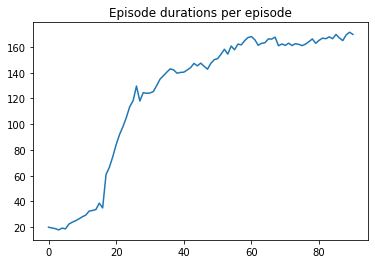

In [9]:
# And see the results
def smooth(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / float(N)

plt.plot(smooth(episode_durations, 10))
plt.title('Episode durations per episode')

In [10]:
# Let's run it!
num_episodes = 100
batch_size = 64
discount_factor = 0.8
learn_rate = 1e-3
memory = ReplayMemory(10000)
num_hidden = 128
seed = 42  # This is not randomly chosen

# We will seed the algorithm (before initializing QNetwork!) for reproducibility
random.seed(seed)
torch.manual_seed(seed)
env.seed(seed)

Q_net = QNetwork(num_hidden)
policy = EpsilonGreedyPolicy(Q_net, 0.05)
episode_durations = run_episodes(train, Q_net, policy, memory, env, num_episodes, batch_size, discount_factor, learn_rate)

 Episode 0 finished after 17 steps
 Episode 10 finished after 28 steps
 Episode 20 finished after 16 steps
 Episode 30 finished after 12 steps
 Episode 40 finished after 13 steps
 Episode 50 finished after 72 steps
 Episode 60 finished after 129 steps
 Episode 70 finished after 136 steps
 Episode 80 finished after 153 steps
 Episode 90 finished after 148 steps
[17, 16, 26, 13, 19, 29, 21, 32, 24, 25, 28, 11, 15, 19, 12, 9, 18, 13, 10, 15, 16, 11, 15, 10, 11, 11, 16, 12, 20, 12, 12, 21, 12, 69, 32, 15, 22, 49, 26, 37, 13, 55, 54, 61, 75, 85, 97, 118, 82, 76, 72, 105, 81, 112, 102, 109, 157, 106, 121, 95, 129, 159, 179, 447, 110, 198, 107, 178, 200, 143, 136, 198, 135, 156, 134, 177, 246, 139, 148, 128, 153, 150, 134, 184, 131, 164, 165, 151, 145, 155, 148, 127, 172, 169, 186, 141, 140, 203, 191, 142]


In [95]:
# Let's run it!
num_episodes = 1000
batch_size = 64
discount_factor = 0.8
learn_rate = 1e-3
memory = ReplayMemory(10000)
num_hidden = 128
seed = 42  # This is not randomly chosen#
results={}
results2={}
counter=0
import datetime as datetime
x=datetime.datetime.now()
for seed in range(10):
    for semib in [True,False]:
        for epsilon in [0.0,.01,.05,.3]:
            for discount_factor in [0.5,.8,1]:
# We will seed the algorithm (before initializing QNetwork!) for reproducibility
                random.seed(seed)
                torch.manual_seed(seed)
                env.seed(seed)

                Q_net = QNetwork(num_hidden)
                policy = EpsilonGreedyPolicy(Q_net, epsilon)
                episode_durations1 = run_episodes(train, Q_net, policy, memory, env, num_episodes, batch_size, discount_factor, learn_rate,semi=semib)
                
                results[counter]={'EpisodeDuration':episode_durations1,'Seed':seed,'SemiB':semib,'Epsilon':epsilon,'DisFactor':discount_factor}
                results2[counter]={'DQN':Q_net,'EpisodeDuration':episode_durations1,'Seed':seed,'SemiB':semib,'Epsilon':epsilon,'DisFactor':discount_factor}

                counter=counter+1
    print(datetime.datetime.now()-x)
results11=pd.DataFrame(results).T
results11.to_hdf('resultsMC.h5','df')

[-5.13235725e-01  3.43684633e-04]
-1.0
 Episode 0 finished after 200 steps
[-0.42463955  0.00980025]
-1.0
 Episode 10 finished after 200 steps
[-0.29778098  0.00680093]
-0.5
 Episode 20 finished after 200 steps
[-0.38873626  0.02462561]
-1.0
 Episode 30 finished after 200 steps
[-0.35720213  0.02791976]
-1.0
 Episode 40 finished after 200 steps
[-0.81305431  0.03295228]
-1.0
 Episode 50 finished after 200 steps
[-0.46216389 -0.04074988]
-1.0
 Episode 60 finished after 200 steps
[-0.216681    0.02141441]
-1.0
 Episode 70 finished after 200 steps
[-0.20903147  0.02804386]
-1.0
 Episode 80 finished after 200 steps
[-0.3073842   0.03194309]
-1.0
 Episode 90 finished after 200 steps
[-0.49949843  0.03997873]
-1.0
 Episode 100 finished after 200 steps
[-0.08289499  0.02268688]
-1.0
 Episode 110 finished after 200 steps
[-0.21430337  0.0232283 ]
-1.0
 Episode 120 finished after 200 steps
[-0.18067612  0.02589046]
-1.0
 Episode 130 finished after 200 steps
[0.12386532 0.01157386]
-0.5
 Episode

[-0.58988451 -0.00466856]
-1.0
 Episode 0 finished after 200 steps
[-0.28374413  0.02834649]
-1.0
 Episode 10 finished after 200 steps
[-0.70076009  0.00828993]
-1.0
 Episode 20 finished after 200 steps
[-0.72191989 -0.05420493]
-1.0
 Episode 30 finished after 200 steps
[-0.58429437  0.05923712]
-1.0
 Episode 40 finished after 200 steps
[0.516254   0.02857029]
-0.5
 Episode 50 finished after 128 steps
[-0.37571725 -0.0060163 ]
-1.0
 Episode 60 finished after 200 steps
[0.50739044 0.01372645]
-0.5
 Episode 70 finished after 153 steps
[0.51739478 0.01984571]
-0.5
 Episode 80 finished after 138 steps
[-0.1267739   0.03529532]
-1.0
 Episode 90 finished after 200 steps
[-0.70091813  0.0462884 ]
-1.0
 Episode 100 finished after 200 steps
[0.5046925  0.02150665]
-0.5
 Episode 110 finished after 137 steps
[-0.07426901  0.03799854]
-1.0
 Episode 120 finished after 200 steps
[-0.02853542  0.02966474]
-1.0
 Episode 130 finished after 200 steps
[-0.37649306  0.00389246]
-1.0
 Episode 140 finished 

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.18431653  0.00306705]
-1.0
 Episode 10 finished after 200 steps
[-0.27984722 -0.03571725]
-1.0
 Episode 20 finished after 200 steps
[-0.7092507   0.00258824]
-1.0
 Episode 30 finished after 200 steps
[-0.29449967 -0.00607887]
-1.0
 Episode 40 finished after 200 steps
[-0.46783223  0.03146541]
-1.0
 Episode 50 finished after 200 steps
[-0.35213086 -0.00221989]
-1.0
 Episode 60 finished after 200 steps
[0.5368578  0.04995707]
-0.5
 Episode 70 finished after 193 steps
[0.0555511  0.05170066]
-1.0
 Episode 80 finished after 200 steps
[-0.5404287  -0.00163928]
-1.0
 Episode 90 finished after 200 steps
[-0.5288475  -0.00571924]
-1.0
 Episode 100 finished after 200 steps
[-0.65908568  0.00229344]
-1.0
 Episode 110 finished after 200 steps
[-5.68276051e-01 -3.16402075e-04]
-1.0
 Episode 120 finished after 200 steps
[-0.23993068  0.00201434]
-0.5
 Episode 130 finished after 200 steps
[-0.36144325  0.01486106]
-1.0
 Episode 1

[-0.59863662 -0.00668532]
-1.0
 Episode 0 finished after 200 steps
[-6.68626348e-01 -5.63556236e-04]
-1.0
 Episode 10 finished after 200 steps
[-0.21773416 -0.03163791]
-1.0
 Episode 20 finished after 200 steps
[-0.49262052  0.05259144]
-1.0
 Episode 30 finished after 200 steps
[0.50260269 0.01109371]
-0.5
 Episode 40 finished after 148 steps
[0.50494478 0.01793541]
-0.5
 Episode 50 finished after 146 steps
[0.14013208 0.02291483]
-0.5
 Episode 60 finished after 200 steps
[-0.84697001  0.03524224]
-1.0
 Episode 70 finished after 200 steps
[-1.17416652  0.00932128]
-1.0
 Episode 80 finished after 200 steps
[-0.27755506  0.03387399]
-1.0
 Episode 90 finished after 200 steps
[-0.54270884  0.03691227]
-1.0
 Episode 100 finished after 200 steps
[-0.55835564  0.03580648]
-1.0
 Episode 110 finished after 200 steps
[-0.27860938  0.03156417]
-1.0
 Episode 120 finished after 200 steps
[-0.61505589  0.03796307]
-1.0
 Episode 130 finished after 200 steps
[-0.19377642  0.02704664]
-1.0
 Episode 140

[-0.59896583 -0.00258067]
-1.0
 Episode 0 finished after 200 steps
[-0.15301207  0.02571267]
-1.0
 Episode 10 finished after 200 steps
[ 0.06291924 -0.00507106]
-1.0
 Episode 20 finished after 200 steps
[0.50591109 0.04944082]
-0.5
 Episode 30 finished after 199 steps
[0.51400426 0.02716109]
-0.5
 Episode 40 finished after 149 steps
[0.52217761 0.03439951]
-0.5
 Episode 50 finished after 131 steps
[0.50726642 0.0188648 ]
-0.5
 Episode 60 finished after 200 steps
[0.5271679  0.03572845]
-0.5
 Episode 70 finished after 132 steps
[-0.56312445  0.04936125]
-1.0
 Episode 80 finished after 200 steps
[0.50805093 0.02231013]
-0.5
 Episode 90 finished after 149 steps
[0.50304266 0.02023282]
-0.5
 Episode 100 finished after 138 steps
[0.51601811 0.01657845]
-0.5
 Episode 110 finished after 149 steps
[-0.12047202  0.03086289]
-1.0
 Episode 120 finished after 200 steps
[-0.31448512  0.04093636]
-1.0
 Episode 130 finished after 200 steps
[-0.14100795 -0.00341695]
-1.0
 Episode 140 finished after 20

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.6648678   0.01721957]
-1.0
 Episode 10 finished after 200 steps
[-0.42466116  0.00897475]
-1.0
 Episode 20 finished after 200 steps
[-0.44374064  0.01048843]
-1.0
 Episode 30 finished after 200 steps
[-0.36951233 -0.00370351]
-1.0
 Episode 40 finished after 200 steps
[-0.57307498 -0.01529959]
-1.0
 Episode 50 finished after 200 steps
[ 0.08602731 -0.00365212]
-1.0
 Episode 60 finished after 200 steps
[0.52598814 0.03505691]
-0.5
 Episode 70 finished after 194 steps
[-0.71104182 -0.02947788]
-1.0
 Episode 80 finished after 200 steps
[-0.60830983 -0.04114056]
-1.0
 Episode 90 finished after 200 steps
[-0.50561836  0.01528457]
-1.0
 Episode 100 finished after 200 steps
[-0.5323919  -0.01168676]
-1.0
 Episode 110 finished after 200 steps
[-7.56956108e-01  7.01980003e-04]
-1.0
 Episode 120 finished after 200 steps
[-0.21492319 -0.00352651]
-1.0
 Episode 130 finished after 200 steps
[-0.89683183 -0.0374805 ]
-1.0
 Episode

[-0.59564343 -0.01365187]
-1.0
 Episode 0 finished after 200 steps
[-0.72618015  0.04241869]
-1.0
 Episode 10 finished after 200 steps
[-0.53482886  0.02147925]
-1.0
 Episode 20 finished after 200 steps
[-0.30135729  0.03857274]
-1.0
 Episode 30 finished after 200 steps
[-0.09602119  0.02994062]
-1.0
 Episode 40 finished after 200 steps
[-0.93770835  0.03205772]
-1.0
 Episode 50 finished after 200 steps
[-0.11902882  0.0276656 ]
-1.0
 Episode 60 finished after 200 steps
[-0.51158323  0.04201895]
-1.0
 Episode 70 finished after 200 steps
[-0.32170711  0.03634664]
-1.0
 Episode 80 finished after 200 steps
[-0.23553276  0.0287779 ]
-1.0
 Episode 90 finished after 200 steps
[-0.57469957  0.04274025]
-1.0
 Episode 100 finished after 200 steps
[-0.45702853  0.03936975]
-1.0
 Episode 110 finished after 200 steps
[-0.30218079  0.03176243]
-1.0
 Episode 120 finished after 200 steps
[-0.57849087  0.03368767]
-1.0
 Episode 130 finished after 200 steps
[-0.20123471  0.02122958]
-1.0
 Episode 140 f

[-0.58988451 -0.00466856]
-1.0
 Episode 0 finished after 200 steps
[-0.2744685   0.02380885]
-1.0
 Episode 10 finished after 200 steps
[-3.42149435e-01 -2.70113583e-04]
-1.0
 Episode 20 finished after 200 steps
[-0.17919016  0.05645963]
-1.0
 Episode 30 finished after 200 steps
[0.5128676  0.01855751]
-0.5
 Episode 40 finished after 129 steps
[-0.71841766  0.04346209]
-1.0
 Episode 50 finished after 200 steps
[-0.40308406 -0.00489943]
-1.0
 Episode 60 finished after 200 steps
[-1.00839041  0.02554294]
-1.0
 Episode 70 finished after 200 steps
[-0.38736684  0.0341943 ]
-1.0
 Episode 80 finished after 200 steps
[-0.14231653  0.03002147]
-1.0
 Episode 90 finished after 200 steps
[-0.70651644  0.03459705]
-1.0
 Episode 100 finished after 200 steps
[-0.54925299  0.03439815]
-1.0
 Episode 110 finished after 200 steps
[-0.35704403  0.02799416]
-1.0
 Episode 120 finished after 200 steps
[-0.15038384  0.0298431 ]
-1.0
 Episode 130 finished after 200 steps
[-0.20059032 -0.0171463 ]
-1.0
 Episode

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.20301209  0.00500706]
-1.0
 Episode 10 finished after 200 steps
[-0.50954943  0.00752318]
-1.0
 Episode 20 finished after 200 steps
[-0.50303883  0.02303111]
-1.0
 Episode 30 finished after 200 steps
[-0.53585119 -0.0134615 ]
-1.0
 Episode 40 finished after 200 steps
[-0.46259893  0.01755316]
-1.0
 Episode 50 finished after 200 steps
[-0.37311196  0.01577547]
-1.0
 Episode 60 finished after 200 steps
[0.52494065 0.02704513]
-0.5
 Episode 70 finished after 182 steps
[-0.70026559  0.03261929]
-1.0
 Episode 80 finished after 200 steps
[-0.66980217 -0.00217286]
-1.0
 Episode 90 finished after 200 steps
[-0.56948294 -0.01229404]
-1.0
 Episode 100 finished after 200 steps
[-0.65889071 -0.02850279]
-1.0
 Episode 110 finished after 200 steps
[-0.5267857  -0.00246075]
-1.0
 Episode 120 finished after 200 steps
[-0.52396644  0.01078531]
-1.0
 Episode 130 finished after 200 steps
[-0.66491723 -0.00203578]
-1.0
 Episode 140 fin

[-0.59863662 -0.00668532]
-1.0
 Episode 0 finished after 200 steps
[-0.33578706  0.01488685]
-1.0
 Episode 10 finished after 200 steps
[-3.77270312e-01  2.47404978e-04]
-0.5
 Episode 20 finished after 200 steps
[-0.09283347  0.02463958]
-0.5
 Episode 30 finished after 200 steps
[-0.876268    0.01610039]
-1.0
 Episode 40 finished after 200 steps
[0.07156712 0.00260574]
-0.5
 Episode 50 finished after 200 steps
[-0.63018678 -0.05151034]
-1.0
 Episode 60 finished after 200 steps
[-0.04935821  0.01403486]
-0.5
 Episode 70 finished after 200 steps
[-0.62460642  0.01994391]
-1.0
 Episode 80 finished after 200 steps
[-0.27480182  0.02303474]
-1.0
 Episode 90 finished after 200 steps
[-0.45529919 -0.03515251]
-1.0
 Episode 100 finished after 200 steps
[-0.30302182 -0.01645569]
-1.0
 Episode 110 finished after 200 steps
[-0.87279377 -0.0366664 ]
-1.0
 Episode 120 finished after 200 steps
[-0.49552849  0.00106813]
-1.0
 Episode 130 finished after 200 steps
[-0.86164918  0.01862595]
-1.0
 Episode

[-0.58988451 -0.00466856]
-1.0
 Episode 0 finished after 200 steps
[-0.22497382 -0.00046306]
-1.0
 Episode 10 finished after 200 steps
[-0.04177295  0.00828507]
-0.5
 Episode 20 finished after 200 steps
[-0.16851346  0.05985278]
-1.0
 Episode 30 finished after 200 steps
[0.52512369 0.02589644]
-0.5
 Episode 40 finished after 145 steps
[0.53416826 0.04156828]
-0.5
 Episode 50 finished after 134 steps
[-0.46258982  0.00150452]
-1.0
 Episode 60 finished after 200 steps
[0.50473473 0.02326916]
-0.5
 Episode 70 finished after 138 steps
[0.5104864  0.01429849]
-0.5
 Episode 80 finished after 151 steps
[0.50221294 0.02715492]
-0.5
 Episode 90 finished after 129 steps
[-0.28191706  0.04252076]
-1.0
 Episode 100 finished after 200 steps
[0.50696656 0.03146344]
-0.5
 Episode 110 finished after 132 steps
[0.51290696 0.01547321]
-0.5
 Episode 120 finished after 132 steps
[-0.43974588  0.03994556]
-1.0
 Episode 130 finished after 200 steps
[-0.40258406  0.03560796]
-1.0
 Episode 140 finished after 

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.06579702  0.01289172]
-0.5
 Episode 10 finished after 200 steps
[-0.04698382  0.02606004]
-0.5
 Episode 20 finished after 200 steps
[-0.70384213  0.01020303]
-1.0
 Episode 30 finished after 200 steps
[-0.85643822 -0.00397915]
-1.0
 Episode 40 finished after 200 steps
[-0.12806355  0.02039098]
-0.5
 Episode 50 finished after 200 steps
[-0.42203151  0.01521257]
-1.0
 Episode 60 finished after 200 steps
[-0.20728769 -0.01544906]
-1.0
 Episode 70 finished after 200 steps
[-0.52161006 -0.01614503]
-1.0
 Episode 80 finished after 200 steps
[-0.53685644  0.0106766 ]
-1.0
 Episode 90 finished after 200 steps
[-0.62056448 -0.00743674]
-1.0
 Episode 100 finished after 200 steps
[-0.47388507  0.00194326]
-1.0
 Episode 110 finished after 200 steps
[-0.75714862  0.03335776]
-1.0
 Episode 120 finished after 200 steps
[-0.16990265  0.05387242]
-1.0
 Episode 130 finished after 200 steps
[-0.12911357  0.03203378]
-0.5
 Episode 140 f

[-0.59946318 -0.01035266]
-1.0
 Episode 0 finished after 200 steps
[-0.42046892  0.00569773]
-1.0
 Episode 10 finished after 200 steps
[-0.68325839  0.00187577]
-1.0
 Episode 20 finished after 200 steps
[-0.34966979  0.05070219]
-1.0
 Episode 30 finished after 200 steps
[-0.16295495  0.00122516]
-0.5
 Episode 40 finished after 200 steps
[0.08357642 0.02190882]
-1.0
 Episode 50 finished after 200 steps
[-1.16742551  0.01307045]
-1.0
 Episode 60 finished after 200 steps
[-0.15488271  0.03802836]
-1.0
 Episode 70 finished after 200 steps
[-0.36593485 -0.05716453]
-1.0
 Episode 80 finished after 200 steps
[ 0.26795713 -0.00671857]
-1.0
 Episode 90 finished after 200 steps
[0.15305208 0.02900471]
-1.0
 Episode 100 finished after 200 steps
[0.05409799 0.01720158]
-1.0
 Episode 110 finished after 200 steps
[-0.42453102  0.04903357]
-1.0
 Episode 120 finished after 200 steps
[-1.11787536  0.0184814 ]
-1.0
 Episode 130 finished after 200 steps
[-0.16107588  0.03921202]
-1.0
 Episode 140 finishe

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.18414337 -0.00327346]
-1.0
 Episode 10 finished after 200 steps
[-0.31352513 -0.01124384]
-1.0
 Episode 20 finished after 200 steps
[-0.26655736 -0.00445103]
-1.0
 Episode 30 finished after 200 steps
[-0.53528755  0.00163827]
-1.0
 Episode 40 finished after 200 steps
[-0.53075112  0.04530664]
-1.0
 Episode 50 finished after 200 steps
[0.51290433 0.02110238]
-0.5
 Episode 60 finished after 154 steps
[0.50475703 0.04738344]
-0.5
 Episode 70 finished after 185 steps
[-0.41719628 -0.00121075]
-1.0
 Episode 80 finished after 200 steps
[-0.55859432 -0.007475  ]
-1.0
 Episode 90 finished after 200 steps
[-0.50364028 -0.00676476]
-1.0
 Episode 100 finished after 200 steps
[-0.43940003 -0.00186558]
-1.0
 Episode 110 finished after 200 steps
[-0.58894452 -0.00858278]
-1.0
 Episode 120 finished after 200 steps
[-1.04250084  0.01726849]
-1.0
 Episode 130 finished after 200 steps
[-0.51708394 -0.06000243]
-1.0
 Episode 140 finis

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.71879913  0.00711813]
-1.0
 Episode 10 finished after 200 steps
[-0.85166549  0.0066361 ]
-1.0
 Episode 20 finished after 200 steps
[-0.68692189  0.00364244]
-1.0
 Episode 30 finished after 200 steps
[-0.80699834  0.0066288 ]
-1.0
 Episode 40 finished after 200 steps
[-7.53195013e-01  2.27221641e-04]
-1.0
 Episode 50 finished after 200 steps
[-0.81670328  0.00982045]
-1.0
 Episode 60 finished after 200 steps
[-0.74251157  0.00472521]
-1.0
 Episode 70 finished after 200 steps
[-0.66322308  0.00723346]
-1.0
 Episode 80 finished after 200 steps
[-0.78474612  0.00404846]
-1.0
 Episode 90 finished after 200 steps
[-0.71747781  0.00540138]
-1.0
 Episode 100 finished after 200 steps
[-0.68357573  0.00478021]
-1.0
 Episode 110 finished after 200 steps
[-0.78591524  0.00610546]
-1.0
 Episode 120 finished after 200 steps
[-0.74551598  0.00410749]
-1.0
 Episode 130 finished after 200 steps
[-0.84644427  0.00829169]
-1.0
 Episo

[-0.59863662 -0.00668532]
-1.0
 Episode 0 finished after 200 steps
[-0.81937142 -0.00525156]
-1.0
 Episode 10 finished after 200 steps
[-0.48660195 -0.01530555]
-1.0
 Episode 20 finished after 200 steps
[-4.53646476e-01  3.11792034e-04]
-1.0
 Episode 30 finished after 200 steps
[-0.4147087   0.00109546]
-1.0
 Episode 40 finished after 200 steps
[-0.39522296 -0.00219232]
-1.0
 Episode 50 finished after 200 steps
[-0.71060797  0.01203858]
-1.0
 Episode 60 finished after 200 steps
[-0.78503992 -0.05379478]
-1.0
 Episode 70 finished after 200 steps
[-0.67438831  0.03129679]
-1.0
 Episode 80 finished after 200 steps
[-0.22624835  0.00878464]
-0.5
 Episode 90 finished after 200 steps
[ 0.05432831 -0.01396554]
-1.0
 Episode 100 finished after 200 steps
[-0.59825483  0.00615043]
-1.0
 Episode 110 finished after 200 steps
[0.54185541 0.04245155]
-0.5
 Episode 120 finished after 155 steps
[0.5111441  0.03141024]
-0.5
 Episode 130 finished after 145 steps
[-1.11209123  0.02243715]
-1.0
 Episode 1

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.71879913  0.00711813]
-1.0
 Episode 10 finished after 200 steps
[-0.98892843 -0.06302846]
-1.0
 Episode 20 finished after 200 steps
[-0.50095308 -0.00192564]
-1.0
 Episode 30 finished after 200 steps
[-0.35279292 -0.00517902]
-1.0
 Episode 40 finished after 200 steps
[-0.52587547  0.00382219]
-1.0
 Episode 50 finished after 200 steps
[-0.52509762  0.00530805]
-1.0
 Episode 60 finished after 200 steps
[-0.67853156  0.00685939]
-1.0
 Episode 70 finished after 200 steps
[-0.57535799  0.01746801]
-1.0
 Episode 80 finished after 200 steps
[-0.69974198 -0.02645164]
-1.0
 Episode 90 finished after 200 steps
[0.5016409  0.00424212]
-0.5
 Episode 100 finished after 194 steps
[-0.3251145  -0.03392178]
-1.0
 Episode 110 finished after 200 steps
[-0.4238667  0.0035087]
-1.0
 Episode 120 finished after 200 steps
[-0.72990188  0.00588256]
-1.0
 Episode 130 finished after 200 steps
[-0.79406038  0.00471774]
-1.0
 Episode 140 finis

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.71879913  0.00711813]
-1.0
 Episode 10 finished after 200 steps
[-0.85166549  0.0066361 ]
-1.0
 Episode 20 finished after 200 steps
[-0.68692189  0.00364244]
-1.0
 Episode 30 finished after 200 steps
[-0.80699834  0.0066288 ]
-1.0
 Episode 40 finished after 200 steps
[-7.53195013e-01  2.27221641e-04]
-1.0
 Episode 50 finished after 200 steps
[-0.81670328  0.00982045]
-1.0
 Episode 60 finished after 200 steps
[-0.74251157  0.00472521]
-1.0
 Episode 70 finished after 200 steps
[-0.66322308  0.00723346]
-1.0
 Episode 80 finished after 200 steps
[-0.78474612  0.00404846]
-1.0
 Episode 90 finished after 200 steps
[-0.71747781  0.00540138]
-1.0
 Episode 100 finished after 200 steps
[-0.68357573  0.00478021]
-1.0
 Episode 110 finished after 200 steps
[-0.78591524  0.00610546]
-1.0
 Episode 120 finished after 200 steps
[-0.74551598  0.00410749]
-1.0
 Episode 130 finished after 200 steps
[-0.84644427  0.00829169]
-1.0
 Episo

[-0.59863662 -0.00668532]
-1.0
 Episode 0 finished after 200 steps
[-0.81937142 -0.00525156]
-1.0
 Episode 10 finished after 200 steps
[-0.48660195 -0.01530555]
-1.0
 Episode 20 finished after 200 steps
[-4.53646476e-01  3.11792034e-04]
-1.0
 Episode 30 finished after 200 steps
[-0.4147087   0.00109546]
-1.0
 Episode 40 finished after 200 steps
[-0.39522296 -0.00219232]
-1.0
 Episode 50 finished after 200 steps
[-0.71060797  0.01203858]
-1.0
 Episode 60 finished after 200 steps
[-0.78503992 -0.05379478]
-1.0
 Episode 70 finished after 200 steps
[-0.67438831  0.03129679]
-1.0
 Episode 80 finished after 200 steps
[-0.22624835  0.00878464]
-0.5
 Episode 90 finished after 200 steps
[ 0.05432831 -0.01396554]
-1.0
 Episode 100 finished after 200 steps
[-0.59825483  0.00615043]
-1.0
 Episode 110 finished after 200 steps
[0.54185541 0.04245155]
-0.5
 Episode 120 finished after 155 steps
[0.5111441  0.03141024]
-0.5
 Episode 130 finished after 145 steps
[-1.11209123  0.02243715]
-1.0
 Episode 1

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.71879913  0.00711813]
-1.0
 Episode 10 finished after 200 steps
[-0.98892843 -0.06302846]
-1.0
 Episode 20 finished after 200 steps
[-0.50095308 -0.00192564]
-1.0
 Episode 30 finished after 200 steps
[-0.35279292 -0.00517902]
-1.0
 Episode 40 finished after 200 steps
[-0.52587547  0.00382219]
-1.0
 Episode 50 finished after 200 steps
[-0.52509762  0.00530805]
-1.0
 Episode 60 finished after 200 steps
[-0.67853156  0.00685939]
-1.0
 Episode 70 finished after 200 steps
[-0.57535799  0.01746801]
-1.0
 Episode 80 finished after 200 steps
[-0.69974198 -0.02645164]
-1.0
 Episode 90 finished after 200 steps
[0.5016409  0.00424212]
-0.5
 Episode 100 finished after 194 steps
[-0.3251145  -0.03392178]
-1.0
 Episode 110 finished after 200 steps
[-0.4238667  0.0035087]
-1.0
 Episode 120 finished after 200 steps
[-0.72990188  0.00588256]
-1.0
 Episode 130 finished after 200 steps
[-0.79406038  0.00471774]
-1.0
 Episode 140 finis

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.71879913  0.00711813]
-1.0
 Episode 10 finished after 200 steps
[-0.85166549  0.0066361 ]
-1.0
 Episode 20 finished after 200 steps
[-0.68692189  0.00364244]
-1.0
 Episode 30 finished after 200 steps
[-0.80699834  0.0066288 ]
-1.0
 Episode 40 finished after 200 steps
[-7.53195013e-01  2.27221641e-04]
-1.0
 Episode 50 finished after 200 steps
[-0.81670328  0.00982045]
-1.0
 Episode 60 finished after 200 steps
[-0.74251157  0.00472521]
-1.0
 Episode 70 finished after 200 steps
[-0.66322308  0.00723346]
-1.0
 Episode 80 finished after 200 steps
[-0.78474612  0.00404846]
-1.0
 Episode 90 finished after 200 steps
[-0.71747781  0.00540138]
-1.0
 Episode 100 finished after 200 steps
[-0.68357573  0.00478021]
-1.0
 Episode 110 finished after 200 steps
[-0.78591524  0.00610546]
-1.0
 Episode 120 finished after 200 steps
[-0.74551598  0.00410749]
-1.0
 Episode 130 finished after 200 steps
[-0.84644427  0.00829169]
-1.0
 Episo

[-0.59863662 -0.00668532]
-1.0
 Episode 0 finished after 200 steps
[-0.81937142 -0.00525156]
-1.0
 Episode 10 finished after 200 steps
[-0.48660195 -0.01530555]
-1.0
 Episode 20 finished after 200 steps
[-4.53646476e-01  3.11792034e-04]
-1.0
 Episode 30 finished after 200 steps
[-0.4147087   0.00109546]
-1.0
 Episode 40 finished after 200 steps
[-0.39522296 -0.00219232]
-1.0
 Episode 50 finished after 200 steps
[-0.71060797  0.01203858]
-1.0
 Episode 60 finished after 200 steps
[-0.78503992 -0.05379478]
-1.0
 Episode 70 finished after 200 steps
[-0.67438831  0.03129679]
-1.0
 Episode 80 finished after 200 steps
[-0.22624835  0.00878464]
-0.5
 Episode 90 finished after 200 steps
[ 0.05432831 -0.01396554]
-1.0
 Episode 100 finished after 200 steps
[-0.59825483  0.00615043]
-1.0
 Episode 110 finished after 200 steps
[0.54185541 0.04245155]
-0.5
 Episode 120 finished after 155 steps
[0.5111441  0.03141024]
-0.5
 Episode 130 finished after 145 steps
[-1.11209123  0.02243715]
-1.0
 Episode 1

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.71879913  0.00711813]
-1.0
 Episode 10 finished after 200 steps
[-0.98892843 -0.06302846]
-1.0
 Episode 20 finished after 200 steps
[-0.50095308 -0.00192564]
-1.0
 Episode 30 finished after 200 steps
[-0.35279292 -0.00517902]
-1.0
 Episode 40 finished after 200 steps
[-0.52587547  0.00382219]
-1.0
 Episode 50 finished after 200 steps
[-0.52509762  0.00530805]
-1.0
 Episode 60 finished after 200 steps
[-0.67853156  0.00685939]
-1.0
 Episode 70 finished after 200 steps
[-0.57535799  0.01746801]
-1.0
 Episode 80 finished after 200 steps
[-0.69974198 -0.02645164]
-1.0
 Episode 90 finished after 200 steps
[0.5016409  0.00424212]
-0.5
 Episode 100 finished after 194 steps
[-0.3251145  -0.03392178]
-1.0
 Episode 110 finished after 200 steps
[-0.4238667  0.0035087]
-1.0
 Episode 120 finished after 200 steps
[-0.72990188  0.00588256]
-1.0
 Episode 130 finished after 200 steps
[-0.79406038  0.00471774]
-1.0
 Episode 140 finis

[-0.62520143 -0.0121391 ]
-1.0
 Episode 0 finished after 200 steps
[-0.71879913  0.00711813]
-1.0
 Episode 10 finished after 200 steps
[-0.85166549  0.0066361 ]
-1.0
 Episode 20 finished after 200 steps
[-0.68692189  0.00364244]
-1.0
 Episode 30 finished after 200 steps
[-0.80699834  0.0066288 ]
-1.0
 Episode 40 finished after 200 steps
[-7.53195013e-01  2.27221641e-04]
-1.0
 Episode 50 finished after 200 steps
[-0.81670328  0.00982045]
-1.0
 Episode 60 finished after 200 steps
[-0.74251157  0.00472521]
-1.0
 Episode 70 finished after 200 steps
[-0.66322308  0.00723346]
-1.0
 Episode 80 finished after 200 steps
[-0.78474612  0.00404846]
-1.0
 Episode 90 finished after 200 steps
[-0.71747781  0.00540138]
-1.0
 Episode 100 finished after 200 steps
[-0.68357573  0.00478021]
-1.0
 Episode 110 finished after 200 steps
[-0.78591524  0.00610546]
-1.0
 Episode 120 finished after 200 steps
[-0.74551598  0.00410749]
-1.0
 Episode 130 finished after 200 steps
[-0.84644427  0.00829169]
-1.0
 Episo

4:02:59.477830
[-0.69149141  0.01880659]
-1.0
 Episode 0 finished after 200 steps
[-0.31518078 -0.01385012]
-1.0
 Episode 10 finished after 200 steps
[-0.62778468  0.00638702]
-1.0
 Episode 20 finished after 200 steps
[-0.40296669 -0.00177083]
-1.0
 Episode 30 finished after 200 steps
[-0.63322688  0.03667364]
-1.0
 Episode 40 finished after 200 steps
[-0.42696809  0.02920065]
-1.0
 Episode 50 finished after 200 steps
[-0.05909558  0.01663922]
-1.0
 Episode 60 finished after 200 steps
[-0.25713423  0.02426221]
-1.0
 Episode 70 finished after 200 steps
[-0.20995838  0.02174005]
-1.0
 Episode 80 finished after 200 steps
[-0.16684479  0.02084342]
-1.0
 Episode 90 finished after 200 steps
[-0.42301727  0.03051096]
-1.0
 Episode 100 finished after 200 steps
[-0.36644047  0.03005005]
-1.0
 Episode 110 finished after 200 steps
[-0.29480729  0.01823005]
-0.5
 Episode 120 finished after 200 steps
[-0.33464942  0.02297228]
-1.0
 Episode 130 finished after 200 steps
[-0.31911017  0.02127917]
-1.0

[-0.6417777   0.01421723]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-1.01913516 -0.01994424]
-1.0
 Episode 20 finished after 200 steps
[-0.13790986  0.00469533]
-0.5
 Episode 30 finished after 200 steps
[-0.79393753  0.01799368]
-1.0
 Episode 40 finished after 200 steps
[-0.38611368  0.02974711]
-1.0
 Episode 50 finished after 200 steps
[-0.07714444  0.01437873]
-0.5
 Episode 60 finished after 200 steps
[-0.15383196  0.02736557]
-1.0
 Episode 70 finished after 200 steps
[-0.42686325  0.03639151]
-1.0
 Episode 80 finished after 200 steps
[-0.28998994  0.03688607]
-1.0
 Episode 90 finished after 200 steps
[-0.42258421  0.04688522]
-1.0
 Episode 100 finished after 200 steps
[-0.43379058  0.03294898]
-1.0
 Episode 110 finished after 200 steps
[-0.36460245 -0.00439405]
-1.0
 Episode 120 finished after 200 steps
[-0.36378148  0.03239021]
-1.0
 Episode 130 finished after 200 steps
[-0.02571898  0.02367015]
-1.0
 Episode 140 f

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.23811829  0.00220292]
-0.5
 Episode 20 finished after 200 steps
[-0.34135545  0.0079601 ]
-1.0
 Episode 30 finished after 200 steps
[-0.27292051 -0.00145831]
-1.0
 Episode 40 finished after 200 steps
[ 0.02922152 -0.00155943]
-1.0
 Episode 50 finished after 200 steps
[-0.38695426 -0.00697358]
-1.0
 Episode 60 finished after 200 steps
[0.50474073 0.013039  ]
-0.5
 Episode 70 finished after 131 steps
[-0.85953503  0.01132311]
-1.0
 Episode 80 finished after 200 steps
[ 0.08892942 -0.01198791]
-1.0
 Episode 90 finished after 200 steps
[-0.38818244  0.02290802]
-1.0
 Episode 100 finished after 200 steps
[-0.33014295  0.0104912 ]
-1.0
 Episode 110 finished after 200 steps
[-0.61501887  0.01674769]
-1.0
 Episode 120 finished after 200 steps
[-0.65695413  0.01286433]
-1.0
 Episode 130 finished after 200 steps
[-0.44034567 -0.00798187]
-1.0
 Episode 140 fin

[-0.56899999  0.01261323]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.08379309 -0.0056748 ]
-1.0
 Episode 20 finished after 200 steps
[-0.2262948  -0.02817627]
-1.0
 Episode 30 finished after 200 steps
[0.51691422 0.02518919]
-0.5
 Episode 40 finished after 155 steps
[-0.98039071  0.03714562]
-1.0
 Episode 50 finished after 200 steps
[-0.177308    0.03725162]
-1.0
 Episode 60 finished after 200 steps
[-0.10699017  0.03174608]
-1.0
 Episode 70 finished after 200 steps
[-0.35777053  0.00073352]
-1.0
 Episode 80 finished after 200 steps
[-0.88713751  0.03215602]
-1.0
 Episode 90 finished after 200 steps
[-0.36231239  0.03097725]
-1.0
 Episode 100 finished after 200 steps
[-0.307051    0.03169269]
-1.0
 Episode 110 finished after 200 steps
[-0.54461511 -0.05153682]
-1.0
 Episode 120 finished after 200 steps
[-0.03070488 -0.02055119]
-1.0
 Episode 130 finished after 200 steps
[-0.43738039  0.03799528]
-1.0
 Episode 140 fin

[-0.61713898  0.01386531]
-1.0
 Episode 0 finished after 200 steps
[-0.50732515  0.01623167]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-0.29731212 -0.01038623]
-1.0
 Episode 30 finished after 200 steps
[-0.87339687 -0.03891762]
-1.0
 Episode 40 finished after 200 steps
[0.50750262 0.02443685]
-0.5
 Episode 50 finished after 161 steps
[0.50557757 0.01270471]
-0.5
 Episode 60 finished after 148 steps
[-1.07586999  0.01881399]
-1.0
 Episode 70 finished after 200 steps
[-0.0544512   0.02713754]
-1.0
 Episode 80 finished after 200 steps
[-0.67011816  0.0378077 ]
-1.0
 Episode 90 finished after 200 steps
[0.06698035 0.02109023]
-1.0
 Episode 100 finished after 200 steps
[-0.02068561  0.02493883]
-1.0
 Episode 110 finished after 200 steps
[-0.08729655 -0.00133673]
-0.5
 Episode 120 finished after 200 steps
[-0.39249958  0.03240216]
-1.0
 Episode 130 finished after 200 steps
[-0.19433127  0.03041749]
-1.0
 Episode 140 finishe

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-0.35439718  0.00398795]
-1.0
 Episode 30 finished after 200 steps
[-0.02210609  0.03067036]
-0.5
 Episode 40 finished after 200 steps
[-0.21915516 -0.00846521]
-1.0
 Episode 50 finished after 200 steps
[-0.42430761  0.01529676]
-1.0
 Episode 60 finished after 200 steps
[-0.37294953  0.01299211]
-1.0
 Episode 70 finished after 200 steps
[-0.43624153 -0.01508442]
-1.0
 Episode 80 finished after 200 steps
[-0.26624248  0.00675009]
-1.0
 Episode 90 finished after 200 steps
[-0.17444266  0.00039404]
-0.5
 Episode 100 finished after 200 steps
[-0.29210163 -0.01141531]
-1.0
 Episode 110 finished after 200 steps
[-0.53451615 -0.00251405]
-1.0
 Episode 120 finished after 200 steps
[-0.42086709 -0.02481246]
-1.0
 Episode 130 finished after 200 steps
[-0.37593887 -0.00098146]
-0.5
 Episode 140 f

[-0.67184467  0.01696237]
-1.0
 Episode 0 finished after 200 steps
[-0.50882643  0.00741189]
-1.0
 Episode 10 finished after 200 steps
[-0.47653185  0.04492881]
-1.0
 Episode 20 finished after 200 steps
[-0.64343773  0.03448776]
-1.0
 Episode 30 finished after 200 steps
[-0.45780457  0.00835995]
-1.0
 Episode 40 finished after 200 steps
[-0.68143344 -0.01694082]
-1.0
 Episode 50 finished after 200 steps
[-0.61328005 -0.01349315]
-1.0
 Episode 60 finished after 200 steps
[-0.58287484  0.00242134]
-1.0
 Episode 70 finished after 200 steps
[-0.5315586  -0.00315016]
-1.0
 Episode 80 finished after 200 steps
[-0.46945297 -0.03389233]
-1.0
 Episode 90 finished after 200 steps
[-0.57234587 -0.00991206]
-1.0
 Episode 100 finished after 200 steps
[-0.56097979 -0.01006298]
-1.0
 Episode 110 finished after 200 steps
[-0.61763334 -0.0032248 ]
-1.0
 Episode 120 finished after 200 steps
[-5.63094113e-01  3.31305133e-05]
-1.0
 Episode 130 finished after 200 steps
[-0.61816021 -0.01222385]
-1.0
 Episo

[-0.6417777   0.01421723]
-1.0
 Episode 0 finished after 200 steps
[-0.95804814  0.03134354]
-1.0
 Episode 10 finished after 200 steps
[ 0.16997489 -0.0174508 ]
-1.0
 Episode 20 finished after 200 steps
[-0.46643303 -0.04159149]
-1.0
 Episode 30 finished after 200 steps
[-1.18752001  0.00500816]
-1.0
 Episode 40 finished after 200 steps
[-0.11737217  0.02319496]
-1.0
 Episode 50 finished after 200 steps
[-0.05017587  0.02285408]
-1.0
 Episode 60 finished after 200 steps
[-0.04316649  0.02856676]
-1.0
 Episode 70 finished after 200 steps
[-0.19223923  0.02981821]
-1.0
 Episode 80 finished after 200 steps
[-0.83537255  0.0351444 ]
-1.0
 Episode 90 finished after 200 steps
[-0.53216786  0.03528889]
-1.0
 Episode 100 finished after 200 steps
[-0.53082103  0.03726245]
-1.0
 Episode 110 finished after 200 steps
[-0.34702837 -0.00187474]
-1.0
 Episode 120 finished after 200 steps
[-0.38160762  0.03452874]
-1.0
 Episode 130 finished after 200 steps
[-0.49713258  0.03336596]
-1.0
 Episode 140 f

[-0.70214242  0.02159241]
-1.0
 Episode 0 finished after 200 steps
[-0.68357007 -0.00411662]
-1.0
 Episode 10 finished after 200 steps
[-0.17096007 -0.0099505 ]
-1.0
 Episode 20 finished after 200 steps
[-0.65777141 -0.00749222]
-1.0
 Episode 30 finished after 200 steps
[0.26826485 0.01843892]
-0.5
 Episode 40 finished after 200 steps
[-0.44209636 -0.02594798]
-1.0
 Episode 50 finished after 200 steps
[0.36446332 0.01585799]
-0.5
 Episode 60 finished after 200 steps
[-0.52407618 -0.02299604]
-1.0
 Episode 70 finished after 200 steps
[0.0601533  0.00879788]
-0.5
 Episode 80 finished after 200 steps
[-0.17881677 -0.02301128]
-1.0
 Episode 90 finished after 200 steps
[-0.30945478 -0.01054892]
-1.0
 Episode 100 finished after 200 steps
[-0.6115138  -0.01449651]
-1.0
 Episode 110 finished after 200 steps
[-0.44488459  0.00447781]
-1.0
 Episode 120 finished after 200 steps
[-0.44954104  0.00628912]
-1.0
 Episode 130 finished after 200 steps
[-0.45559205  0.00087795]
-1.0
 Episode 140 finishe

[-0.5939754   0.01270032]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-1.01753633  0.03365551]
-1.0
 Episode 30 finished after 200 steps
[0.50931516 0.01452279]
-0.5
 Episode 40 finished after 137 steps
[-0.40802715  0.04203617]
-1.0
 Episode 50 finished after 200 steps
[-0.09579578  0.02310886]
-1.0
 Episode 60 finished after 200 steps
[-0.45962185  0.04227621]
-1.0
 Episode 70 finished after 200 steps
[0.09722788 0.02427136]
-1.0
 Episode 80 finished after 200 steps
[-0.29554656  0.03186373]
-1.0
 Episode 90 finished after 200 steps
[0.0038064 0.0170436]
-1.0
 Episode 100 finished after 200 steps
[-0.54067784  0.0392951 ]
-1.0
 Episode 110 finished after 200 steps
[-0.09083039  0.02089627]
-1.0
 Episode 120 finished after 200 steps
[-0.46072423  0.04078567]
-1.0
 Episode 130 finished after 200 steps
[-0.22530633  0.02577449]
-1.0
 Episode 140 finished 

[-0.6417777   0.01421723]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.24512052  0.00507371]
-0.5
 Episode 20 finished after 200 steps
[-0.39812822 -0.00141596]
-1.0
 Episode 30 finished after 200 steps
[-1.09133494  0.02143409]
-1.0
 Episode 40 finished after 200 steps
[-1.16612091  0.01135127]
-1.0
 Episode 50 finished after 200 steps
[0.12835798 0.03215988]
-0.5
 Episode 60 finished after 200 steps
[-0.20017912  0.03925002]
-1.0
 Episode 70 finished after 200 steps
[-0.22646699  0.04526602]
-1.0
 Episode 80 finished after 200 steps
[-0.02237677  0.03848381]
-1.0
 Episode 90 finished after 200 steps
[-0.16463543  0.04637801]
-1.0
 Episode 100 finished after 200 steps
[-0.25502781  0.04104288]
-1.0
 Episode 110 finished after 200 steps
[-0.39064429 -0.00302946]
-1.0
 Episode 120 finished after 200 steps
[-0.48474028  0.03662228]
-1.0
 Episode 130 finished after 200 steps
[-0.04621994  0.02401208]
-1.0
 Episode 140 fin

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-0.39648736 -0.00182932]
-1.0
 Episode 30 finished after 200 steps
[-0.62695258  0.01241018]
-1.0
 Episode 40 finished after 200 steps
[-0.23398089  0.01499515]
-1.0
 Episode 50 finished after 200 steps
[-0.62063966 -0.03259262]
-1.0
 Episode 60 finished after 200 steps
[-1.04795859 -0.02121986]
-1.0
 Episode 70 finished after 200 steps
[-0.62137836  0.00168519]
-1.0
 Episode 80 finished after 200 steps
[-0.8800061 -0.0066546]
-1.0
 Episode 90 finished after 200 steps
[-0.68108729  0.02211449]
-1.0
 Episode 100 finished after 200 steps
[-0.78469775  0.00684657]
-1.0
 Episode 110 finished after 200 steps
[-0.49642336 -0.00862355]
-1.0
 Episode 120 finished after 200 steps
[-0.62549965  0.01258818]
-1.0
 Episode 130 finished after 200 steps
[-0.4025227   0.00314204]
-0.5
 Episode 140 fin

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.39020381 -0.00876549]
-1.0
 Episode 10 finished after 200 steps
[-3.94747249e-01  2.77514403e-04]
-1.0
 Episode 20 finished after 200 steps
[-0.35528789  0.00116248]
-0.5
 Episode 30 finished after 200 steps
[-0.56333969 -0.01316919]
-1.0
 Episode 40 finished after 200 steps
[-0.49542242  0.05478669]
-1.0
 Episode 50 finished after 200 steps
[0.51069359 0.02468492]
-0.5
 Episode 60 finished after 156 steps
[-1.0985397  -0.04493447]
-1.0
 Episode 70 finished after 200 steps
[ 0.3561781  -0.01455114]
-1.0
 Episode 80 finished after 200 steps
[0.50943321 0.01184703]
-0.5
 Episode 90 finished after 143 steps
[-0.08531348  0.04470039]
-1.0
 Episode 100 finished after 200 steps
[0.20351696 0.01243951]
-0.5
 Episode 110 finished after 200 steps
[-0.33799727 -0.00159075]
-1.0
 Episode 120 finished after 200 steps
[-1.16170732 -0.01560336]
-1.0
 Episode 130 finished after 200 steps
[-1.04398925 -0.02894175]
-1.0
 Episode 140

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-0.54040333  0.01004545]
-1.0
 Episode 30 finished after 200 steps
[-0.67057143  0.0034009 ]
-1.0
 Episode 40 finished after 200 steps
[0.47056033 0.04864486]
-0.5
 Episode 50 finished after 200 steps
[-0.80700806 -0.05291443]
-1.0
 Episode 60 finished after 200 steps
[-0.43351371 -0.00559238]
-1.0
 Episode 70 finished after 200 steps
[-0.3825085  -0.00071712]
-1.0
 Episode 80 finished after 200 steps
[-0.51804046 -0.00520795]
-1.0
 Episode 90 finished after 200 steps
[-0.5621597   0.00209819]
-1.0
 Episode 100 finished after 200 steps
[-0.73087226  0.00662146]
-1.0
 Episode 110 finished after 200 steps
[ 0.26552994 -0.0043211 ]
-1.0
 Episode 120 finished after 200 steps
[0.4593052  0.00594949]
-0.5
 Episode 130 finished after 200 steps
[-0.43363169  0.00503275]
-1.0
 Episode 140 finis

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.89257333  0.00706254]
-1.0
 Episode 10 finished after 200 steps
[-0.84334617  0.00565748]
-1.0
 Episode 20 finished after 200 steps
[-0.9380015   0.00141718]
-1.0
 Episode 30 finished after 200 steps
[-0.67057143  0.0034009 ]
-1.0
 Episode 40 finished after 200 steps
[-0.72684256  0.00851698]
-1.0
 Episode 50 finished after 200 steps
[-0.7510904  0.0045715]
-1.0
 Episode 60 finished after 200 steps
[-0.71779989  0.00180851]
-1.0
 Episode 70 finished after 200 steps
[-0.96609684 -0.00291003]
-1.0
 Episode 80 finished after 200 steps
[-0.68519499  0.00559382]
-1.0
 Episode 90 finished after 200 steps
[-0.83685031  0.00494541]
-1.0
 Episode 100 finished after 200 steps
[-0.71951337  0.01216494]
-1.0
 Episode 110 finished after 200 steps
[-0.89175314  0.00180503]
-1.0
 Episode 120 finished after 200 steps
[-0.7178902   0.00903838]
-1.0
 Episode 130 finished after 200 steps
[-0.86096156  0.00706756]
-1.0
 Episode 140 fin

[-0.64970517  0.01595709]
-1.0
 Episode 0 finished after 200 steps
[-0.44676894 -0.00487467]
-1.0
 Episode 10 finished after 200 steps
[-0.56097375 -0.04045794]
-1.0
 Episode 20 finished after 200 steps
[-0.51048601 -0.01124877]
-1.0
 Episode 30 finished after 200 steps
[-0.53795031  0.01577743]
-1.0
 Episode 40 finished after 200 steps
[-0.61210276  0.00457208]
-1.0
 Episode 50 finished after 200 steps
[-0.31777324 -0.02236037]
-1.0
 Episode 60 finished after 200 steps
[-1.15078992 -0.00170094]
-1.0
 Episode 70 finished after 200 steps
[-1.01839542  0.02168283]
-1.0
 Episode 80 finished after 200 steps
[-1.05119184  0.03015569]
-1.0
 Episode 90 finished after 200 steps
[-0.19799649  0.02127739]
-1.0
 Episode 100 finished after 200 steps
[ 0.22173269 -0.01900119]
-1.0
 Episode 110 finished after 200 steps
[0.45573892 0.0164048 ]
-0.5
 Episode 120 finished after 200 steps
[-0.18229506  0.02063207]
-1.0
 Episode 130 finished after 200 steps
[-0.06610386  0.02762797]
-1.0
 Episode 140 fin

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-0.54040333  0.01004545]
-1.0
 Episode 30 finished after 200 steps
[-0.52748502 -0.00420853]
-1.0
 Episode 40 finished after 200 steps
[0.09496193 0.00766541]
-0.5
 Episode 50 finished after 200 steps
[0.50416536 0.01743344]
-0.5
 Episode 60 finished after 145 steps
[-0.3397196  -0.00488676]
-1.0
 Episode 70 finished after 200 steps
[-0.4065028 -0.0018174]
-1.0
 Episode 80 finished after 200 steps
[-0.52949187  0.00376247]
-1.0
 Episode 90 finished after 200 steps
[-0.53674611  0.00258053]
-1.0
 Episode 100 finished after 200 steps
[-0.78112703  0.00342317]
-1.0
 Episode 110 finished after 200 steps
[-0.29778672  0.05735025]
-1.0
 Episode 120 finished after 200 steps
[-0.73933801  0.00502375]
-1.0
 Episode 130 finished after 200 steps
[-0.34122652 -0.00607966]
-1.0
 Episode 140 finishe

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.89257333  0.00706254]
-1.0
 Episode 10 finished after 200 steps
[-0.84334617  0.00565748]
-1.0
 Episode 20 finished after 200 steps
[-0.9380015   0.00141718]
-1.0
 Episode 30 finished after 200 steps
[-0.67057143  0.0034009 ]
-1.0
 Episode 40 finished after 200 steps
[-0.72684256  0.00851698]
-1.0
 Episode 50 finished after 200 steps
[-0.7510904  0.0045715]
-1.0
 Episode 60 finished after 200 steps
[-0.71779989  0.00180851]
-1.0
 Episode 70 finished after 200 steps
[-0.96609684 -0.00291003]
-1.0
 Episode 80 finished after 200 steps
[-0.68519499  0.00559382]
-1.0
 Episode 90 finished after 200 steps
[-0.83685031  0.00494541]
-1.0
 Episode 100 finished after 200 steps
[-0.71951337  0.01216494]
-1.0
 Episode 110 finished after 200 steps
[-0.89175314  0.00180503]
-1.0
 Episode 120 finished after 200 steps
[-0.7178902   0.00903838]
-1.0
 Episode 130 finished after 200 steps
[-0.86096156  0.00706756]
-1.0
 Episode 140 fin

[-0.64970517  0.01595709]
-1.0
 Episode 0 finished after 200 steps
[-0.44676894 -0.00487467]
-1.0
 Episode 10 finished after 200 steps
[-0.56097375 -0.04045794]
-1.0
 Episode 20 finished after 200 steps
[-0.51048601 -0.01124877]
-1.0
 Episode 30 finished after 200 steps
[-0.53795031  0.01577743]
-1.0
 Episode 40 finished after 200 steps
[-0.61210276  0.00457208]
-1.0
 Episode 50 finished after 200 steps
[-0.31777324 -0.02236037]
-1.0
 Episode 60 finished after 200 steps
[-1.15078992 -0.00170094]
-1.0
 Episode 70 finished after 200 steps
[-1.01839542  0.02168283]
-1.0
 Episode 80 finished after 200 steps
[-1.05119184  0.03015569]
-1.0
 Episode 90 finished after 200 steps
[-0.19799649  0.02127739]
-1.0
 Episode 100 finished after 200 steps
[ 0.22173269 -0.01900119]
-1.0
 Episode 110 finished after 200 steps
[0.45573892 0.0164048 ]
-0.5
 Episode 120 finished after 200 steps
[-0.18229506  0.02063207]
-1.0
 Episode 130 finished after 200 steps
[-0.06610386  0.02762797]
-1.0
 Episode 140 fin

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-0.54040333  0.01004545]
-1.0
 Episode 30 finished after 200 steps
[-0.52748502 -0.00420853]
-1.0
 Episode 40 finished after 200 steps
[0.09496193 0.00766541]
-0.5
 Episode 50 finished after 200 steps
[0.50416536 0.01743344]
-0.5
 Episode 60 finished after 145 steps
[-0.3397196  -0.00488676]
-1.0
 Episode 70 finished after 200 steps
[-0.4065028 -0.0018174]
-1.0
 Episode 80 finished after 200 steps
[-0.52949187  0.00376247]
-1.0
 Episode 90 finished after 200 steps
[-0.53674611  0.00258053]
-1.0
 Episode 100 finished after 200 steps
[-0.78112703  0.00342317]
-1.0
 Episode 110 finished after 200 steps
[-0.29778672  0.05735025]
-1.0
 Episode 120 finished after 200 steps
[-0.73933801  0.00502375]
-1.0
 Episode 130 finished after 200 steps
[-0.34122652 -0.00607966]
-1.0
 Episode 140 finishe

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.89257333  0.00706254]
-1.0
 Episode 10 finished after 200 steps
[-0.84334617  0.00565748]
-1.0
 Episode 20 finished after 200 steps
[-0.9380015   0.00141718]
-1.0
 Episode 30 finished after 200 steps
[-0.67057143  0.0034009 ]
-1.0
 Episode 40 finished after 200 steps
[-0.72684256  0.00851698]
-1.0
 Episode 50 finished after 200 steps
[-0.7510904  0.0045715]
-1.0
 Episode 60 finished after 200 steps
[-0.71779989  0.00180851]
-1.0
 Episode 70 finished after 200 steps
[-0.96609684 -0.00291003]
-1.0
 Episode 80 finished after 200 steps
[-0.68519499  0.00559382]
-1.0
 Episode 90 finished after 200 steps
[-0.83685031  0.00494541]
-1.0
 Episode 100 finished after 200 steps
[-0.71951337  0.01216494]
-1.0
 Episode 110 finished after 200 steps
[-0.89175314  0.00180503]
-1.0
 Episode 120 finished after 200 steps
[-0.7178902   0.00903838]
-1.0
 Episode 130 finished after 200 steps
[-0.86096156  0.00706756]
-1.0
 Episode 140 fin

[-0.64970517  0.01595709]
-1.0
 Episode 0 finished after 200 steps
[-0.44676894 -0.00487467]
-1.0
 Episode 10 finished after 200 steps
[-0.56097375 -0.04045794]
-1.0
 Episode 20 finished after 200 steps
[-0.51048601 -0.01124877]
-1.0
 Episode 30 finished after 200 steps
[-0.53795031  0.01577743]
-1.0
 Episode 40 finished after 200 steps
[-0.61210276  0.00457208]
-1.0
 Episode 50 finished after 200 steps
[-0.31777324 -0.02236037]
-1.0
 Episode 60 finished after 200 steps
[-1.15078992 -0.00170094]
-1.0
 Episode 70 finished after 200 steps
[-1.01839542  0.02168283]
-1.0
 Episode 80 finished after 200 steps
[-1.05119184  0.03015569]
-1.0
 Episode 90 finished after 200 steps
[-0.19799649  0.02127739]
-1.0
 Episode 100 finished after 200 steps
[ 0.22173269 -0.01900119]
-1.0
 Episode 110 finished after 200 steps
[0.45573892 0.0164048 ]
-0.5
 Episode 120 finished after 200 steps
[-0.18229506  0.02063207]
-1.0
 Episode 130 finished after 200 steps
[-0.06610386  0.02762797]
-1.0
 Episode 140 fin

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.37677172 -0.00675354]
-1.0
 Episode 10 finished after 200 steps
[-0.36365988 -0.00411052]
-1.0
 Episode 20 finished after 200 steps
[-0.54040333  0.01004545]
-1.0
 Episode 30 finished after 200 steps
[-0.52748502 -0.00420853]
-1.0
 Episode 40 finished after 200 steps
[0.09496193 0.00766541]
-0.5
 Episode 50 finished after 200 steps
[0.50416536 0.01743344]
-0.5
 Episode 60 finished after 145 steps
[-0.3397196  -0.00488676]
-1.0
 Episode 70 finished after 200 steps
[-0.4065028 -0.0018174]
-1.0
 Episode 80 finished after 200 steps
[-0.52949187  0.00376247]
-1.0
 Episode 90 finished after 200 steps
[-0.53674611  0.00258053]
-1.0
 Episode 100 finished after 200 steps
[-0.78112703  0.00342317]
-1.0
 Episode 110 finished after 200 steps
[-0.29778672  0.05735025]
-1.0
 Episode 120 finished after 200 steps
[-0.73933801  0.00502375]
-1.0
 Episode 130 finished after 200 steps
[-0.34122652 -0.00607966]
-1.0
 Episode 140 finishe

[-0.73690426  0.01685366]
-1.0
 Episode 0 finished after 200 steps
[-0.89257333  0.00706254]
-1.0
 Episode 10 finished after 200 steps
[-0.84334617  0.00565748]
-1.0
 Episode 20 finished after 200 steps
[-0.9380015   0.00141718]
-1.0
 Episode 30 finished after 200 steps
[-0.67057143  0.0034009 ]
-1.0
 Episode 40 finished after 200 steps
[-0.72684256  0.00851698]
-1.0
 Episode 50 finished after 200 steps
[-0.7510904  0.0045715]
-1.0
 Episode 60 finished after 200 steps
[-0.71779989  0.00180851]
-1.0
 Episode 70 finished after 200 steps
[-0.96609684 -0.00291003]
-1.0
 Episode 80 finished after 200 steps
[-0.68519499  0.00559382]
-1.0
 Episode 90 finished after 200 steps
[-0.83685031  0.00494541]
-1.0
 Episode 100 finished after 200 steps
[-0.71951337  0.01216494]
-1.0
 Episode 110 finished after 200 steps
[-0.89175314  0.00180503]
-1.0
 Episode 120 finished after 200 steps
[-0.7178902   0.00903838]
-1.0
 Episode 130 finished after 200 steps
[-0.86096156  0.00706756]
-1.0
 Episode 140 fin

15:00:41.275881
[-0.58400874  0.00375716]
-1.0
 Episode 0 finished after 200 steps
[-0.3269541 -0.0136364]
-1.0
 Episode 10 finished after 200 steps
[0.50804763 0.01044864]
-0.5
 Episode 20 finished after 173 steps
[ 0.22143358 -0.02221546]
-1.0
 Episode 30 finished after 200 steps
[-0.56481275  0.0350059 ]
-1.0
 Episode 40 finished after 200 steps
[-0.16621394  0.03699088]
-1.0
 Episode 50 finished after 200 steps
[-0.72169565  0.03711628]
-1.0
 Episode 60 finished after 200 steps
[-0.3416154   0.03437377]
-1.0
 Episode 70 finished after 200 steps
[-0.04808123  0.01857812]
-1.0
 Episode 80 finished after 200 steps
[-0.10816243  0.02433388]
-1.0
 Episode 90 finished after 200 steps
[-0.30526617  0.02987048]
-1.0
 Episode 100 finished after 200 steps
[-0.16429283  0.02265662]
-1.0
 Episode 110 finished after 200 steps
[-0.59018588  0.04039143]
-1.0
 Episode 120 finished after 200 steps
[-0.01737234 -0.00351585]
-1.0
 Episode 130 finished after 200 steps
[-0.39267419  0.03679394]
-1.0
 E

[-0.51781707  0.00854985]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.166884   -0.00336785]
-1.0
 Episode 20 finished after 200 steps
[-0.36268277 -0.00072984]
-1.0
 Episode 30 finished after 200 steps
[-0.15576853 -0.023672  ]
-1.0
 Episode 40 finished after 200 steps
[0.53800151 0.03940953]
-0.5
 Episode 50 finished after 137 steps
[0.50801242 0.04433788]
-0.5
 Episode 60 finished after 131 steps
[0.51133616 0.01629018]
-0.5
 Episode 70 finished after 131 steps
[-0.04555779  0.03296638]
-1.0
 Episode 80 finished after 200 steps
[-0.28495409  0.04043597]
-1.0
 Episode 90 finished after 200 steps
[0.5099047  0.02354855]
-0.5
 Episode 100 finished after 132 steps
[-1.02970117  0.03050622]
-1.0
 Episode 110 finished after 200 steps
[0.50591624 0.01375147]
-0.5
 Episode 120 finished after 162 steps
[-0.90502308  0.03160476]
-1.0
 Episode 130 finished after 200 steps
[0.50055779 0.00898558]
-0.5
 Episode 140 finished afte

[-0.5471446   0.01012961]
-1.0
 Episode 0 finished after 200 steps
[-0.24940213  0.02561646]
-0.5
 Episode 10 finished after 200 steps
[-0.48727759  0.0076448 ]
-1.0
 Episode 20 finished after 200 steps
[-0.33983085  0.00054375]
-1.0
 Episode 30 finished after 200 steps
[-0.646262   -0.00828254]
-1.0
 Episode 40 finished after 200 steps
[-0.17543907 -0.01541494]
-1.0
 Episode 50 finished after 200 steps
[-0.32442527 -0.00515236]
-1.0
 Episode 60 finished after 200 steps
[0.34307107 0.00415495]
-0.5
 Episode 70 finished after 200 steps
[-0.78853497 -0.02473577]
-1.0
 Episode 80 finished after 200 steps
[-0.30653418  0.0063471 ]
-1.0
 Episode 90 finished after 200 steps
[-0.6148607  -0.03074642]
-1.0
 Episode 100 finished after 200 steps
[-0.07524412  0.03510615]
-1.0
 Episode 110 finished after 200 steps
[-0.6489484   0.00283786]
-1.0
 Episode 120 finished after 200 steps
[-3.76811484e-01  2.03292834e-04]
-1.0
 Episode 130 finished after 200 steps
[-0.46693712 -0.00659159]
-1.0
 Episode

[-0.52350072  0.00946851]
-1.0
 Episode 0 finished after 200 steps
[-0.40432664 -0.00244057]
-1.0
 Episode 10 finished after 200 steps
[-0.51891667 -0.01928967]
-1.0
 Episode 20 finished after 200 steps
[0.14274202 0.00372287]
-0.5
 Episode 30 finished after 200 steps
[-0.35372711  0.04551161]
-1.0
 Episode 40 finished after 200 steps
[0.50852191 0.01691326]
-0.5
 Episode 50 finished after 144 steps
[0.50106241 0.0086949 ]
-0.5
 Episode 60 finished after 186 steps
[-0.20842161  0.04112769]
-1.0
 Episode 70 finished after 200 steps
[-0.0168935   0.03293048]
-1.0
 Episode 80 finished after 200 steps
[-0.0738085   0.02914947]
-1.0
 Episode 90 finished after 200 steps
[-0.16148808  0.02858846]
-1.0
 Episode 100 finished after 200 steps
[0.04911308 0.01420931]
-1.0
 Episode 110 finished after 200 steps
[-0.13731596  0.02606051]
-1.0
 Episode 120 finished after 200 steps
[-0.22243097  0.02672882]
-1.0
 Episode 130 finished after 200 steps
[-0.21882428  0.02773115]
-1.0
 Episode 140 finished 

[-0.44918344  0.00986744]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.42530048 -0.00884266]
-1.0
 Episode 20 finished after 200 steps
[-0.35159093  0.01490006]
-1.0
 Episode 30 finished after 200 steps
[-0.19857452  0.04927435]
-1.0
 Episode 40 finished after 200 steps
[0.41838858 0.03514644]
-0.5
 Episode 50 finished after 200 steps
[0.51150119 0.01293684]
-0.5
 Episode 60 finished after 154 steps
[-0.3802617  0.0401785]
-1.0
 Episode 70 finished after 200 steps
[-0.22867044  0.04057132]
-1.0
 Episode 80 finished after 200 steps
[-0.40644077  0.0506694 ]
-1.0
 Episode 90 finished after 200 steps
[-0.09304502  0.03657978]
-1.0
 Episode 100 finished after 200 steps
[0.10744574 0.03262726]
-0.5
 Episode 110 finished after 200 steps
[0.1319825  0.02929283]
-0.5
 Episode 120 finished after 200 steps
[-0.06140299  0.02279002]
-1.0
 Episode 130 finished after 200 steps
[0.01493519 0.02381925]
-0.5
 Episode 140 finished afte

[-0.58569408  0.00965918]
-1.0
 Episode 0 finished after 200 steps
[-0.2450911   0.00311224]
-0.5
 Episode 10 finished after 200 steps
[-0.36352489 -0.00114898]
-1.0
 Episode 20 finished after 200 steps
[-0.75953274  0.00436829]
-1.0
 Episode 30 finished after 200 steps
[-0.57175651 -0.01581905]
-1.0
 Episode 40 finished after 200 steps
[-0.57377153 -0.02367491]
-1.0
 Episode 50 finished after 200 steps
[-0.06416679  0.00349001]
-0.5
 Episode 60 finished after 200 steps
[-0.68182834 -0.04716438]
-1.0
 Episode 70 finished after 200 steps
[-0.54529244 -0.00063724]
-1.0
 Episode 80 finished after 200 steps
[-0.48809679 -0.00080202]
-1.0
 Episode 90 finished after 200 steps
[-0.67549934  0.00462342]
-1.0
 Episode 100 finished after 200 steps
[-0.48731446  0.0489874 ]
-1.0
 Episode 110 finished after 200 steps
[-0.0533255   0.00033908]
-1.0
 Episode 120 finished after 200 steps
[-0.16648679  0.03845507]
-0.5
 Episode 130 finished after 200 steps
[-0.34420208  0.01833129]
-0.5
 Episode 140 f

[-0.50001107  0.0083506 ]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[0.50190296 0.01656624]
-0.5
 Episode 20 finished after 199 steps
[0.16917628 0.01879465]
-0.5
 Episode 30 finished after 200 steps
[-0.25588276  0.04236682]
-1.0
 Episode 40 finished after 200 steps
[0.50365771 0.01202105]
-0.5
 Episode 50 finished after 149 steps
[-1.2  0. ]
-1.0
 Episode 60 finished after 200 steps
[-0.07818617  0.03497106]
-1.0
 Episode 70 finished after 200 steps
[-0.37073839  0.04631967]
-1.0
 Episode 80 finished after 200 steps
[-0.41023652  0.04741612]
-1.0
 Episode 90 finished after 200 steps
[-0.1484017   0.03547042]
-1.0
 Episode 100 finished after 200 steps
[-0.15004353  0.03048985]
-1.0
 Episode 110 finished after 200 steps
[-0.47449995  0.0386995 ]
-1.0
 Episode 120 finished after 200 steps
[-0.18054474  0.0306381 ]
-1.0
 Episode 130 finished after 200 steps
[-0.31011971  0.03000157]
-1.0
 Episode 140 finished after 200 st

[-0.53010871  0.01035866]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.36352489 -0.00114898]
-1.0
 Episode 20 finished after 200 steps
[-0.32704538 -0.00267195]
-1.0
 Episode 30 finished after 200 steps
[-0.76708749 -0.02500962]
-1.0
 Episode 40 finished after 200 steps
[0.51758375 0.02746496]
-0.5
 Episode 50 finished after 129 steps
[0.04288141 0.04939137]
-1.0
 Episode 60 finished after 200 steps
[0.51252425 0.01648981]
-0.5
 Episode 70 finished after 136 steps
[-0.30101189  0.04873687]
-1.0
 Episode 80 finished after 200 steps
[0.51602042 0.01792362]
-0.5
 Episode 90 finished after 138 steps
[-0.03745438  0.03764276]
-1.0
 Episode 100 finished after 200 steps
[-0.23487584  0.03502381]
-1.0
 Episode 110 finished after 200 steps
[-0.75565869  0.03984101]
-1.0
 Episode 120 finished after 200 steps
[-0.72883653  0.0356499 ]
-1.0
 Episode 130 finished after 200 steps
[-0.02491166  0.0157295 ]
-0.5
 Episode 140 finished 

[-0.56505253  0.00884921]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.36352489 -0.00114898]
-1.0
 Episode 20 finished after 200 steps
[-0.32704538 -0.00267195]
-1.0
 Episode 30 finished after 200 steps
[-0.44128271  0.01710594]
-1.0
 Episode 40 finished after 200 steps
[-0.2580222  -0.00731268]
-1.0
 Episode 50 finished after 200 steps
[-0.29050431 -0.00965324]
-1.0
 Episode 60 finished after 200 steps
[-0.50134158  0.01058108]
-1.0
 Episode 70 finished after 200 steps
[-0.26542241 -0.00560927]
-1.0
 Episode 80 finished after 200 steps
[-0.31950328 -0.00450616]
-1.0
 Episode 90 finished after 200 steps
[-0.47530003  0.00126174]
-1.0
 Episode 100 finished after 200 steps
[-0.31906038  0.00134214]
-1.0
 Episode 110 finished after 200 steps
[-0.34329563 -0.00787135]
-1.0
 Episode 120 finished after 200 steps
[-0.40612388 -0.00284023]
-1.0
 Episode 130 finished after 200 steps
[-0.45573816 -0.00498942]
-1.0
 Episode 140 f

[-0.52350072  0.00946851]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[0.50061774 0.02554788]
-0.5
 Episode 20 finished after 177 steps
[0.50287506 0.0102651 ]
-0.5
 Episode 30 finished after 168 steps
[-0.34050041  0.05322806]
-1.0
 Episode 40 finished after 200 steps
[-0.27195758  0.04039085]
-1.0
 Episode 50 finished after 200 steps
[-0.28881281  0.04229864]
-1.0
 Episode 60 finished after 200 steps
[-0.08839257  0.0341578 ]
-1.0
 Episode 70 finished after 200 steps
[-0.57465589  0.04776497]
-1.0
 Episode 80 finished after 200 steps
[-0.47166151  0.04163753]
-1.0
 Episode 90 finished after 200 steps
[-0.15877627  0.03098371]
-1.0
 Episode 100 finished after 200 steps
[-0.24961267  0.03483699]
-1.0
 Episode 110 finished after 200 steps
[-0.30288827  0.03407914]
-1.0
 Episode 120 finished after 200 steps
[-0.29498852  0.02895286]
-1.0
 Episode 130 finished after 200 steps
[-0.31455997  0.03551469]
-1.0
 Episode 140 finis

[-0.51781707  0.00854985]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.54073599  0.01583777]
-1.0
 Episode 20 finished after 200 steps
[-0.39068992  0.01844366]
-1.0
 Episode 30 finished after 200 steps
[-0.3441319  -0.00205463]
-1.0
 Episode 40 finished after 200 steps
[0.13461948 0.05202731]
-1.0
 Episode 50 finished after 200 steps
[0.51471228 0.02405263]
-0.5
 Episode 60 finished after 139 steps
[-0.07520632  0.04439119]
-1.0
 Episode 70 finished after 200 steps
[0.02339002 0.03635288]
-1.0
 Episode 80 finished after 200 steps
[-0.07324142  0.04184039]
-1.0
 Episode 90 finished after 200 steps
[-0.56936514  0.0490425 ]
-1.0
 Episode 100 finished after 200 steps
[-0.40460309  0.03908796]
-1.0
 Episode 110 finished after 200 steps
[-0.04014686  0.02206727]
-0.5
 Episode 120 finished after 200 steps
[-0.59735785  0.04253553]
-1.0
 Episode 130 finished after 200 steps
[-0.15141478  0.02012073]
-1.0
 Episode 140 finishe

[-0.55227006  0.00718182]
-1.0
 Episode 0 finished after 200 steps
[-0.6407832   0.00574521]
-1.0
 Episode 10 finished after 200 steps
[ 1.4734148e-01 -1.1135314e-05]
-0.5
 Episode 20 finished after 200 steps
[-0.38586268  0.00241594]
-1.0
 Episode 30 finished after 200 steps
[-0.43362275  0.03137153]
-1.0
 Episode 40 finished after 200 steps
[-0.93844314  0.0062619 ]
-1.0
 Episode 50 finished after 200 steps
[-0.27956513  0.03814061]
-1.0
 Episode 60 finished after 200 steps
[0.3564817  0.03708724]
-0.5
 Episode 70 finished after 200 steps
[-0.41434517  0.00096813]
-1.0
 Episode 80 finished after 200 steps
[-0.53515827  0.00253416]
-1.0
 Episode 90 finished after 200 steps
[-0.60273513  0.01478779]
-1.0
 Episode 100 finished after 200 steps
[-0.49649205  0.0039196 ]
-1.0
 Episode 110 finished after 200 steps
[-0.66052753  0.02446603]
-1.0
 Episode 120 finished after 200 steps
[-0.18268735  0.01181315]
-1.0
 Episode 130 finished after 200 steps
[-0.08058222  0.00445741]
-0.5
 Episode 1

[-0.51781707  0.00854985]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.53002186 -0.00522979]
-1.0
 Episode 20 finished after 200 steps
[-0.83972073 -0.04723669]
-1.0
 Episode 30 finished after 200 steps
[-1.00281523 -0.00257248]
-1.0
 Episode 40 finished after 200 steps
[-0.19882613 -0.03627454]
-1.0
 Episode 50 finished after 200 steps
[-1.11445195  0.00117679]
-1.0
 Episode 60 finished after 200 steps
[-0.84913493 -0.05107828]
-1.0
 Episode 70 finished after 200 steps
[-1.1016539 -0.011276 ]
-1.0
 Episode 80 finished after 200 steps
[-0.7675241  0.0415336]
-1.0
 Episode 90 finished after 200 steps
[-1.13252313 -0.03250084]
-1.0
 Episode 100 finished after 200 steps
[ 0.06015691 -0.00397847]
-1.0
 Episode 110 finished after 200 steps
[0.07086074 0.01427076]
-1.0
 Episode 120 finished after 200 steps
[-2.57372722e-01  1.52259565e-04]
-0.5
 Episode 130 finished after 200 steps
[-0.08518001  0.01523507]
-1.0
 Episode 140

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.36352489 -0.00114898]
-1.0
 Episode 20 finished after 200 steps
[-0.87039719  0.010985  ]
-1.0
 Episode 30 finished after 200 steps
[0.5320636  0.04772979]
-0.5
 Episode 40 finished after 154 steps
[-0.57497553 -0.00526419]
-1.0
 Episode 50 finished after 200 steps
[-0.32395787  0.04667126]
-1.0
 Episode 60 finished after 200 steps
[-0.40958581  0.04043286]
-1.0
 Episode 70 finished after 200 steps
[-4.27367618e-01 -3.95674526e-04]
-1.0
 Episode 80 finished after 200 steps
[-0.62801408 -0.02166445]
-1.0
 Episode 90 finished after 200 steps
[-0.54535694  0.03217667]
-1.0
 Episode 100 finished after 200 steps
[-0.52682983  0.00538184]
-1.0
 Episode 110 finished after 200 steps
[-0.48754988  0.00676953]
-1.0
 Episode 120 finished after 200 steps
[-0.75909493  0.00913241]
-1.0
 Episode 130 finished after 200 steps
[-0.70116744 -0.00660906]
-1.0
 Episode 1

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.89859579  0.004647  ]
-1.0
 Episode 10 finished after 200 steps
[-0.90799021  0.00215418]
-1.0
 Episode 20 finished after 200 steps
[-0.89545328  0.00266582]
-1.0
 Episode 30 finished after 200 steps
[-0.88697623  0.00357616]
-1.0
 Episode 40 finished after 200 steps
[-0.69786317  0.00455626]
-1.0
 Episode 50 finished after 200 steps
[-7.59403797e-01 -1.26501406e-04]
-1.0
 Episode 60 finished after 200 steps
[-0.70426342  0.01024393]
-1.0
 Episode 70 finished after 200 steps
[-0.77223372  0.00961127]
-1.0
 Episode 80 finished after 200 steps
[-0.76468982  0.00248532]
-1.0
 Episode 90 finished after 200 steps
[-0.71134047  0.00766011]
-1.0
 Episode 100 finished after 200 steps
[-0.81413296  0.00824521]
-1.0
 Episode 110 finished after 200 steps
[-0.91044301  0.00446287]
-1.0
 Episode 120 finished after 200 steps
[-0.7400092   0.00945734]
-1.0
 Episode 130 finished after 200 steps
[-0.83420847  0.00948344]
-1.0
 Episode

[-0.53303319  0.00690943]
-1.0
 Episode 0 finished after 200 steps
[-0.27829401  0.01497595]
-1.0
 Episode 10 finished after 200 steps
[-0.55684803 -0.0233364 ]
-1.0
 Episode 20 finished after 200 steps
[-0.48171925  0.0022236 ]
-1.0
 Episode 30 finished after 200 steps
[-0.49472577  0.00227565]
-1.0
 Episode 40 finished after 200 steps
[-0.51191791 -0.01218105]
-1.0
 Episode 50 finished after 200 steps
[-0.4119882   0.00220392]
-1.0
 Episode 60 finished after 200 steps
[-0.40093809  0.02358834]
-1.0
 Episode 70 finished after 200 steps
[-0.50280668 -0.05948306]
-1.0
 Episode 80 finished after 200 steps
[-0.4973944  -0.06590244]
-1.0
 Episode 90 finished after 200 steps
[ 0.11246324 -0.00403716]
-1.0
 Episode 100 finished after 200 steps
[-0.55338671 -0.02165322]
-1.0
 Episode 110 finished after 200 steps
[-1.11637842 -0.0280817 ]
-1.0
 Episode 120 finished after 200 steps
[0.51105027 0.02772463]
-0.5
 Episode 130 finished after 200 steps
[0.39390979 0.0084218 ]
-0.5
 Episode 140 finis

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.5422563   0.00615039]
-1.0
 Episode 20 finished after 200 steps
[-0.58616289  0.03823741]
-1.0
 Episode 30 finished after 200 steps
[-0.49305054  0.05103296]
-1.0
 Episode 40 finished after 200 steps
[-1.11787536  0.0184814 ]
-1.0
 Episode 50 finished after 200 steps
[-0.32634411 -0.02207876]
-1.0
 Episode 60 finished after 200 steps
[-0.46225692 -0.00382129]
-1.0
 Episode 70 finished after 200 steps
[-0.52791349 -0.00217126]
-1.0
 Episode 80 finished after 200 steps
[-0.47971724 -0.00448663]
-1.0
 Episode 90 finished after 200 steps
[-0.74293507  0.00910019]
-1.0
 Episode 100 finished after 200 steps
[-0.54032432  0.04462464]
-1.0
 Episode 110 finished after 200 steps
[0.32970641 0.04605265]
-1.0
 Episode 120 finished after 200 steps
[-0.18808734 -0.00301395]
-1.0
 Episode 130 finished after 200 steps
[-0.47323511 -0.01020499]
-1.0
 Episode 140 finis

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.89859579  0.004647  ]
-1.0
 Episode 10 finished after 200 steps
[-0.90799021  0.00215418]
-1.0
 Episode 20 finished after 200 steps
[-0.89545328  0.00266582]
-1.0
 Episode 30 finished after 200 steps
[-0.88697623  0.00357616]
-1.0
 Episode 40 finished after 200 steps
[-0.69786317  0.00455626]
-1.0
 Episode 50 finished after 200 steps
[-7.59403797e-01 -1.26501406e-04]
-1.0
 Episode 60 finished after 200 steps
[-0.70426342  0.01024393]
-1.0
 Episode 70 finished after 200 steps
[-0.77223372  0.00961127]
-1.0
 Episode 80 finished after 200 steps
[-0.76468982  0.00248532]
-1.0
 Episode 90 finished after 200 steps
[-0.71134047  0.00766011]
-1.0
 Episode 100 finished after 200 steps
[-0.81413296  0.00824521]
-1.0
 Episode 110 finished after 200 steps
[-0.91044301  0.00446287]
-1.0
 Episode 120 finished after 200 steps
[-0.7400092   0.00945734]
-1.0
 Episode 130 finished after 200 steps
[-0.83420847  0.00948344]
-1.0
 Episode

[-0.53303319  0.00690943]
-1.0
 Episode 0 finished after 200 steps
[-0.27829401  0.01497595]
-1.0
 Episode 10 finished after 200 steps
[-0.55684803 -0.0233364 ]
-1.0
 Episode 20 finished after 200 steps
[-0.48171925  0.0022236 ]
-1.0
 Episode 30 finished after 200 steps
[-0.49472577  0.00227565]
-1.0
 Episode 40 finished after 200 steps
[-0.51191791 -0.01218105]
-1.0
 Episode 50 finished after 200 steps
[-0.4119882   0.00220392]
-1.0
 Episode 60 finished after 200 steps
[-0.40093809  0.02358834]
-1.0
 Episode 70 finished after 200 steps
[-0.50280668 -0.05948306]
-1.0
 Episode 80 finished after 200 steps
[-0.4973944  -0.06590244]
-1.0
 Episode 90 finished after 200 steps
[ 0.11246324 -0.00403716]
-1.0
 Episode 100 finished after 200 steps
[-0.55338671 -0.02165322]
-1.0
 Episode 110 finished after 200 steps
[-1.11637842 -0.0280817 ]
-1.0
 Episode 120 finished after 200 steps
[0.51105027 0.02772463]
-0.5
 Episode 130 finished after 200 steps
[0.39390979 0.0084218 ]
-0.5
 Episode 140 finis

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.5422563   0.00615039]
-1.0
 Episode 20 finished after 200 steps
[-0.58616289  0.03823741]
-1.0
 Episode 30 finished after 200 steps
[-0.49305054  0.05103296]
-1.0
 Episode 40 finished after 200 steps
[-1.11787536  0.0184814 ]
-1.0
 Episode 50 finished after 200 steps
[-0.32634411 -0.02207876]
-1.0
 Episode 60 finished after 200 steps
[-0.46225692 -0.00382129]
-1.0
 Episode 70 finished after 200 steps
[-0.52791349 -0.00217126]
-1.0
 Episode 80 finished after 200 steps
[-0.47971724 -0.00448663]
-1.0
 Episode 90 finished after 200 steps
[-0.74293507  0.00910019]
-1.0
 Episode 100 finished after 200 steps
[-0.54032432  0.04462464]
-1.0
 Episode 110 finished after 200 steps
[0.32970641 0.04605265]
-1.0
 Episode 120 finished after 200 steps
[-0.18808734 -0.00301395]
-1.0
 Episode 130 finished after 200 steps
[-0.47323511 -0.01020499]
-1.0
 Episode 140 finis

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.89859579  0.004647  ]
-1.0
 Episode 10 finished after 200 steps
[-0.90799021  0.00215418]
-1.0
 Episode 20 finished after 200 steps
[-0.89545328  0.00266582]
-1.0
 Episode 30 finished after 200 steps
[-0.88697623  0.00357616]
-1.0
 Episode 40 finished after 200 steps
[-0.69786317  0.00455626]
-1.0
 Episode 50 finished after 200 steps
[-7.59403797e-01 -1.26501406e-04]
-1.0
 Episode 60 finished after 200 steps
[-0.70426342  0.01024393]
-1.0
 Episode 70 finished after 200 steps
[-0.77223372  0.00961127]
-1.0
 Episode 80 finished after 200 steps
[-0.76468982  0.00248532]
-1.0
 Episode 90 finished after 200 steps
[-0.71134047  0.00766011]
-1.0
 Episode 100 finished after 200 steps
[-0.81413296  0.00824521]
-1.0
 Episode 110 finished after 200 steps
[-0.91044301  0.00446287]
-1.0
 Episode 120 finished after 200 steps
[-0.7400092   0.00945734]
-1.0
 Episode 130 finished after 200 steps
[-0.83420847  0.00948344]
-1.0
 Episode

[-0.53303319  0.00690943]
-1.0
 Episode 0 finished after 200 steps
[-0.27829401  0.01497595]
-1.0
 Episode 10 finished after 200 steps
[-0.55684803 -0.0233364 ]
-1.0
 Episode 20 finished after 200 steps
[-0.48171925  0.0022236 ]
-1.0
 Episode 30 finished after 200 steps
[-0.49472577  0.00227565]
-1.0
 Episode 40 finished after 200 steps
[-0.51191791 -0.01218105]
-1.0
 Episode 50 finished after 200 steps
[-0.4119882   0.00220392]
-1.0
 Episode 60 finished after 200 steps
[-0.40093809  0.02358834]
-1.0
 Episode 70 finished after 200 steps
[-0.50280668 -0.05948306]
-1.0
 Episode 80 finished after 200 steps
[-0.4973944  -0.06590244]
-1.0
 Episode 90 finished after 200 steps
[ 0.11246324 -0.00403716]
-1.0
 Episode 100 finished after 200 steps
[-0.55338671 -0.02165322]
-1.0
 Episode 110 finished after 200 steps
[-1.11637842 -0.0280817 ]
-1.0
 Episode 120 finished after 200 steps
[0.51105027 0.02772463]
-0.5
 Episode 130 finished after 200 steps
[0.39390979 0.0084218 ]
-0.5
 Episode 140 finis

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.3460282   0.00268898]
-1.0
 Episode 10 finished after 200 steps
[-0.5422563   0.00615039]
-1.0
 Episode 20 finished after 200 steps
[-0.58616289  0.03823741]
-1.0
 Episode 30 finished after 200 steps
[-0.49305054  0.05103296]
-1.0
 Episode 40 finished after 200 steps
[-1.11787536  0.0184814 ]
-1.0
 Episode 50 finished after 200 steps
[-0.32634411 -0.02207876]
-1.0
 Episode 60 finished after 200 steps
[-0.46225692 -0.00382129]
-1.0
 Episode 70 finished after 200 steps
[-0.52791349 -0.00217126]
-1.0
 Episode 80 finished after 200 steps
[-0.47971724 -0.00448663]
-1.0
 Episode 90 finished after 200 steps
[-0.74293507  0.00910019]
-1.0
 Episode 100 finished after 200 steps
[-0.54032432  0.04462464]
-1.0
 Episode 110 finished after 200 steps
[0.32970641 0.04605265]
-1.0
 Episode 120 finished after 200 steps
[-0.18808734 -0.00301395]
-1.0
 Episode 130 finished after 200 steps
[-0.47323511 -0.01020499]
-1.0
 Episode 140 finis

[-0.5916358  0.0077029]
-1.0
 Episode 0 finished after 200 steps
[-0.89859579  0.004647  ]
-1.0
 Episode 10 finished after 200 steps
[-0.90799021  0.00215418]
-1.0
 Episode 20 finished after 200 steps
[-0.89545328  0.00266582]
-1.0
 Episode 30 finished after 200 steps
[-0.88697623  0.00357616]
-1.0
 Episode 40 finished after 200 steps
[-0.69786317  0.00455626]
-1.0
 Episode 50 finished after 200 steps
[-7.59403797e-01 -1.26501406e-04]
-1.0
 Episode 60 finished after 200 steps
[-0.70426342  0.01024393]
-1.0
 Episode 70 finished after 200 steps
[-0.77223372  0.00961127]
-1.0
 Episode 80 finished after 200 steps
[-0.76468982  0.00248532]
-1.0
 Episode 90 finished after 200 steps
[-0.71134047  0.00766011]
-1.0
 Episode 100 finished after 200 steps
[-0.81413296  0.00824521]
-1.0
 Episode 110 finished after 200 steps
[-0.91044301  0.00446287]
-1.0
 Episode 120 finished after 200 steps
[-0.7400092   0.00945734]
-1.0
 Episode 130 finished after 200 steps
[-0.83420847  0.00948344]
-1.0
 Episode

16:44:24.576878
[-0.51149119  0.0215837 ]
-1.0
 Episode 0 finished after 200 steps
[-0.52626321  0.02797288]
-1.0
 Episode 10 finished after 200 steps
[-0.23400361  0.00132974]
-1.0
 Episode 20 finished after 200 steps
[0.11944659 0.0254779 ]
-0.5
 Episode 30 finished after 200 steps
[-0.3701292   0.03090494]
-1.0
 Episode 40 finished after 200 steps
[-0.0511747  0.0197191]
-1.0
 Episode 50 finished after 200 steps
[-0.59524551  0.03752042]
-1.0
 Episode 60 finished after 200 steps
[-0.14853199  0.02275284]
-1.0
 Episode 70 finished after 200 steps
[-0.12917082  0.02209705]
-1.0
 Episode 80 finished after 200 steps
[-0.54725856  0.03664021]
-1.0
 Episode 90 finished after 200 steps
[-0.27774696  0.02523027]
-1.0
 Episode 100 finished after 200 steps
[-0.54774352  0.03829215]
-1.0
 Episode 110 finished after 200 steps
[-0.76219713  0.02221657]
-1.0
 Episode 120 finished after 200 steps
[-0.56046768  0.03983356]
-1.0
 Episode 130 finished after 200 steps
[-0.61074444  0.04151602]
-1.0
 E

[-0.50448002  0.01865391]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-1.05882537  0.02865941]
-1.0
 Episode 20 finished after 200 steps
[-0.30587207 -0.00726295]
-1.0
 Episode 30 finished after 200 steps
[0.51183247 0.03629611]
-0.5
 Episode 40 finished after 125 steps
[-0.44070498 -0.00048232]
-1.0
 Episode 50 finished after 200 steps
[-0.35696277  0.04746543]
-1.0
 Episode 60 finished after 200 steps
[-0.2547085   0.03751216]
-1.0
 Episode 70 finished after 200 steps
[-0.37494052  0.03910224]
-1.0
 Episode 80 finished after 200 steps
[-0.92022486  0.03147891]
-1.0
 Episode 90 finished after 200 steps
[-0.12453048  0.0309066 ]
-1.0
 Episode 100 finished after 200 steps
[-0.27533163  0.03441235]
-1.0
 Episode 110 finished after 200 steps
[-0.40313579 -0.00198803]
-1.0
 Episode 120 finished after 200 steps
[0.03150393 0.02260408]
-1.0
 Episode 130 finished after 200 steps
[-0.74863633  0.03457907]
-1.0
 Episode 140 finis

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.09703318 -0.00421858]
-1.0
 Episode 20 finished after 200 steps
[-0.25011631 -0.00403348]
-1.0
 Episode 30 finished after 200 steps
[-0.14843676  0.01317048]
-1.0
 Episode 40 finished after 200 steps
[-0.17052816 -0.01549345]
-1.0
 Episode 50 finished after 200 steps
[-0.21711689  0.04098123]
-1.0
 Episode 60 finished after 200 steps
[-0.5987709  -0.00142939]
-1.0
 Episode 70 finished after 200 steps
[-0.59393292  0.00246919]
-1.0
 Episode 80 finished after 200 steps
[-0.70345382  0.01476005]
-1.0
 Episode 90 finished after 200 steps
[-5.34047321e-01  2.73828672e-04]
-1.0
 Episode 100 finished after 200 steps
[-0.54242917  0.00167689]
-1.0
 Episode 110 finished after 200 steps
[-0.53708062 -0.00410376]
-1.0
 Episode 120 finished after 200 steps
[-0.14304352  0.01205585]
-0.5
 Episode 130 finished after 200 steps
[-6.39489289e-01  5.83382269e-04]
-1.

[-0.50119217  0.01650234]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.33088898  0.04212552]
-1.0
 Episode 20 finished after 200 steps
[-0.38499942  0.0439745 ]
-1.0
 Episode 30 finished after 200 steps
[0.50452465 0.01538582]
-0.5
 Episode 40 finished after 145 steps
[-0.26563008  0.03350003]
-0.5
 Episode 50 finished after 200 steps
[-1.08188105  0.02596117]
-1.0
 Episode 60 finished after 200 steps
[-0.4033263   0.04564566]
-1.0
 Episode 70 finished after 200 steps
[-0.20107171  0.03442434]
-1.0
 Episode 80 finished after 200 steps
[-0.13461356  0.02437578]
-1.0
 Episode 90 finished after 200 steps
[-0.03766882  0.02149266]
-1.0
 Episode 100 finished after 200 steps
[-0.20967558  0.0258038 ]
-1.0
 Episode 110 finished after 200 steps
[-0.06961336  0.01099516]
-0.5
 Episode 120 finished after 200 steps
[-0.22685998  0.0251256 ]
-1.0
 Episode 130 finished after 200 steps
[-0.43166186  0.03674915]
-1.0
 Episode 140 fin

[-0.50448002  0.01865391]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.12086534  0.01388582]
-1.0
 Episode 20 finished after 200 steps
[-0.54498922  0.05000145]
-1.0
 Episode 30 finished after 200 steps
[-1.10895677 -0.055248  ]
-1.0
 Episode 40 finished after 200 steps
[-1.14244163  0.01627968]
-1.0
 Episode 50 finished after 200 steps
[-0.68648327  0.04445717]
-1.0
 Episode 60 finished after 200 steps
[-0.22685845  0.03470979]
-1.0
 Episode 70 finished after 200 steps
[-0.07482805  0.03449741]
-0.5
 Episode 80 finished after 200 steps
[0.50793778 0.01212593]
-0.5
 Episode 90 finished after 158 steps
[0.50063632 0.01057368]
-0.5
 Episode 100 finished after 158 steps
[-0.2487841   0.03687791]
-1.0
 Episode 110 finished after 200 steps
[-0.19954491  0.02494893]
-0.5
 Episode 120 finished after 200 steps
[-0.28184483  0.03288814]
-1.0
 Episode 130 finished after 200 steps
[-0.418476    0.03524595]
-1.0
 Episode 140 finis

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-8.24046576e-01  3.29422787e-04]
-1.0
 Episode 10 finished after 200 steps
[-0.1255363   0.01251252]
-1.0
 Episode 20 finished after 200 steps
[-0.62968049  0.01700162]
-1.0
 Episode 30 finished after 200 steps
[-0.73417577 -0.00695386]
-1.0
 Episode 40 finished after 200 steps
[-0.43680488  0.00745394]
-1.0
 Episode 50 finished after 200 steps
[-0.70119697  0.00958191]
-1.0
 Episode 60 finished after 200 steps
[-0.2710501  -0.01107184]
-1.0
 Episode 70 finished after 200 steps
[-0.34706258 -0.00631948]
-1.0
 Episode 80 finished after 200 steps
[-0.5875929  -0.00655292]
-1.0
 Episode 90 finished after 200 steps
[-0.47595145  0.00154344]
-0.5
 Episode 100 finished after 200 steps
[-0.69198353  0.01032264]
-1.0
 Episode 110 finished after 200 steps
[-0.65020492 -0.01038207]
-1.0
 Episode 120 finished after 200 steps
[-0.37931593  0.00559698]
-0.5
 Episode 130 finished after 200 steps
[-0.62336386  0.00175971]
-1.0
 Episo

[-0.54181312  0.02013839]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.5866117   0.00790315]
-1.0
 Episode 20 finished after 200 steps
[-0.1269609  -0.00383213]
-1.0
 Episode 30 finished after 200 steps
[-0.2051715   0.03427246]
-1.0
 Episode 40 finished after 200 steps
[ 0.11958081 -0.02080062]
-1.0
 Episode 50 finished after 200 steps
[-0.36469238  0.03602591]
-1.0
 Episode 60 finished after 200 steps
[-0.23363455  0.0324135 ]
-1.0
 Episode 70 finished after 200 steps
[0.00597276 0.02007615]
-1.0
 Episode 80 finished after 200 steps
[-0.37180409  0.03210292]
-1.0
 Episode 90 finished after 200 steps
[-0.18888333  0.02663359]
-1.0
 Episode 100 finished after 200 steps
[-0.44854322  0.03454644]
-1.0
 Episode 110 finished after 200 steps
[-0.77860755  0.02301601]
-1.0
 Episode 120 finished after 200 steps
[-0.3283631   0.03156551]
-1.0
 Episode 130 finished after 200 steps
[-0.10552105  0.01408455]
-1.0
 Episode 140 fin

[-0.50448002  0.01865391]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.76884885  0.01027907]
-1.0
 Episode 20 finished after 200 steps
[-0.09895171  0.02977828]
-0.5
 Episode 30 finished after 200 steps
[0.50369339 0.0088072 ]
-0.5
 Episode 40 finished after 167 steps
[-0.34728587 -0.02354689]
-1.0
 Episode 50 finished after 200 steps
[0.5134483  0.02568096]
-0.5
 Episode 60 finished after 130 steps
[-0.30717493  0.03973568]
-1.0
 Episode 70 finished after 200 steps
[0.04270079 0.02399175]
-1.0
 Episode 80 finished after 200 steps
[0.50744057 0.02666606]
-0.5
 Episode 90 finished after 132 steps
[-0.80652425 -0.06840457]
-1.0
 Episode 100 finished after 200 steps
[0.5035617  0.01671124]
-0.5
 Episode 110 finished after 152 steps
[-0.36894968  0.00223561]
-1.0
 Episode 120 finished after 200 steps
[-0.18083938  0.03524562]
-1.0
 Episode 130 finished after 200 steps
[-0.21248075  0.0344217 ]
-1.0
 Episode 140 finished af

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-1.17363961  0.0075905 ]
-1.0
 Episode 10 finished after 200 steps
[-0.14028861  0.01435655]
-1.0
 Episode 20 finished after 200 steps
[-0.48587619  0.00236031]
-1.0
 Episode 30 finished after 200 steps
[-0.61338974  0.00867389]
-1.0
 Episode 40 finished after 200 steps
[-0.71745773 -0.01509718]
-1.0
 Episode 50 finished after 200 steps
[-0.36605107 -0.04190956]
-1.0
 Episode 60 finished after 200 steps
[-0.79089232 -0.00850197]
-1.0
 Episode 70 finished after 200 steps
[-0.41385179 -0.0072034 ]
-1.0
 Episode 80 finished after 200 steps
[-0.94131352 -0.00205731]
-1.0
 Episode 90 finished after 200 steps
[-0.45156481  0.00051995]
-0.5
 Episode 100 finished after 200 steps
[-0.83954416 -0.03000246]
-1.0
 Episode 110 finished after 200 steps
[-0.25427828  0.00323305]
-0.5
 Episode 120 finished after 200 steps
[-0.51912303  0.0334566 ]
-1.0
 Episode 130 finished after 200 steps
[-0.06384492  0.0044286 ]
-0.5
 Episode 140 f

[-0.49289381  0.01701876]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.29919456  0.01410761]
-1.0
 Episode 20 finished after 200 steps
[-0.7201593   0.03535522]
-1.0
 Episode 30 finished after 200 steps
[-0.39713296  0.036911  ]
-1.0
 Episode 40 finished after 200 steps
[-0.41832066  0.00254799]
-1.0
 Episode 50 finished after 200 steps
[-0.33499346  0.03192914]
-1.0
 Episode 60 finished after 200 steps
[0.04631025 0.0166741 ]
-1.0
 Episode 70 finished after 200 steps
[0.03528953 0.01718163]
-1.0
 Episode 80 finished after 200 steps
[-0.38530195  0.03760254]
-1.0
 Episode 90 finished after 200 steps
[-0.34875089  0.03657529]
-1.0
 Episode 100 finished after 200 steps
[-0.54321187  0.04465849]
-1.0
 Episode 110 finished after 200 steps
[-0.775305   -0.00286629]
-1.0
 Episode 120 finished after 200 steps
[-0.13993338  0.02489486]
-1.0
 Episode 130 finished after 200 steps
[-0.16534449  0.0255381 ]
-1.0
 Episode 140 finis

[-0.50448002  0.01865391]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.501762    0.05313706]
-1.0
 Episode 20 finished after 200 steps
[-0.17385825  0.03033867]
-1.0
 Episode 30 finished after 200 steps
[0.51678632 0.01768552]
-0.5
 Episode 40 finished after 149 steps
[-0.51304063  0.02658659]
-1.0
 Episode 50 finished after 200 steps
[0.04025098 0.03686563]
-1.0
 Episode 60 finished after 200 steps
[-0.04580351  0.04116704]
-1.0
 Episode 70 finished after 200 steps
[-0.1837793   0.04455514]
-1.0
 Episode 80 finished after 200 steps
[0.0421388  0.03630549]
-1.0
 Episode 90 finished after 200 steps
[0.50990915 0.01311854]
-0.5
 Episode 100 finished after 150 steps
[-0.47688211  0.03835686]
-1.0
 Episode 110 finished after 200 steps
[0.02459258 0.01749888]
-0.5
 Episode 120 finished after 200 steps
[-0.43961511  0.03560125]
-1.0
 Episode 130 finished after 200 steps
[-0.8286869   0.03837049]
-1.0
 Episode 140 finished af

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.32606174 -0.00779861]
-1.0
 Episode 10 finished after 200 steps
[-0.27616722  0.00973619]
-1.0
 Episode 20 finished after 200 steps
[-0.4284377   0.00597358]
-1.0
 Episode 30 finished after 200 steps
[-6.23561546e-01  5.61841909e-04]
-1.0
 Episode 40 finished after 200 steps
[-0.54331705 -0.00452291]
-1.0
 Episode 50 finished after 200 steps
[-0.32138525  0.03146163]
-1.0
 Episode 60 finished after 200 steps
[-0.7064702   0.02988783]
-1.0
 Episode 70 finished after 200 steps
[-0.2781422  -0.01017588]
-1.0
 Episode 80 finished after 200 steps
[-0.36487888 -0.01107759]
-1.0
 Episode 90 finished after 200 steps
[-0.40866532  0.00737171]
-1.0
 Episode 100 finished after 200 steps
[-1.01821639 -0.02077196]
-1.0
 Episode 110 finished after 200 steps
[-0.90968894 -0.02270644]
-1.0
 Episode 120 finished after 200 steps
[-0.63772217  0.00318758]
-1.0
 Episode 130 finished after 200 steps
[-0.59679833 -0.01739416]
-1.0
 Episo

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.30403428  0.00337042]
-0.5
 Episode 20 finished after 200 steps
[-0.28950722 -0.0019614 ]
-1.0
 Episode 30 finished after 200 steps
[-0.21551869 -0.03200069]
-1.0
 Episode 40 finished after 200 steps
[-0.50736701 -0.00131062]
-1.0
 Episode 50 finished after 200 steps
[-0.5143822   0.00879955]
-1.0
 Episode 60 finished after 200 steps
[-0.33368333 -0.00159177]
-1.0
 Episode 70 finished after 200 steps
[-0.14811199  0.03679251]
-1.0
 Episode 80 finished after 200 steps
[-0.23609699  0.04190298]
-1.0
 Episode 90 finished after 200 steps
[-0.95924043  0.02703397]
-1.0
 Episode 100 finished after 200 steps
[0.52500068 0.02723496]
-0.5
 Episode 110 finished after 178 steps
[0.23145357 0.02082399]
-0.5
 Episode 120 finished after 200 steps
[-1.15843254 -0.02702751]
-1.0
 Episode 130 finished after 200 steps
[-0.04731049  0.02179825]
-1.0
 Episode 140 finis

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.14857742 -0.00807881]
-1.0
 Episode 20 finished after 200 steps
[-0.2189273  -0.00175103]
-1.0
 Episode 30 finished after 200 steps
[-0.0941982   0.05288561]
-1.0
 Episode 40 finished after 200 steps
[0.52218888 0.04340496]
-0.5
 Episode 50 finished after 145 steps
[-0.51894679 -0.00746502]
-1.0
 Episode 60 finished after 200 steps
[-5.34904729e-01 -3.52578431e-05]
-1.0
 Episode 70 finished after 200 steps
[-0.40591212  0.00116341]
-1.0
 Episode 80 finished after 200 steps
[-0.4442874  -0.00754269]
-1.0
 Episode 90 finished after 200 steps
[-0.6698289   0.00924514]
-1.0
 Episode 100 finished after 200 steps
[-1.04441391 -0.00124959]
-1.0
 Episode 110 finished after 200 steps
[0.39638713 0.0211136 ]
-0.5
 Episode 120 finished after 200 steps
[-0.547995    0.00149389]
-1.0
 Episode 130 finished after 200 steps
[-0.37311124 -0.00077373]
-1.0
 Episode 1

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.52508179  0.01126622]
-1.0
 Episode 10 finished after 200 steps
[-0.51027345 -0.0060382 ]
-1.0
 Episode 20 finished after 200 steps
[-0.52041785 -0.00196177]
-1.0
 Episode 30 finished after 200 steps
[-0.52552803 -0.00325749]
-1.0
 Episode 40 finished after 200 steps
[-0.5375552  0.0128663]
-1.0
 Episode 50 finished after 200 steps
[-0.53343967 -0.00312571]
-1.0
 Episode 60 finished after 200 steps
[-0.52304612 -0.00387809]
-1.0
 Episode 70 finished after 200 steps
[-0.52666586  0.00325435]
-1.0
 Episode 80 finished after 200 steps
[-0.50492352  0.003024  ]
-1.0
 Episode 90 finished after 200 steps
[-4.72258637e-01  4.34415252e-04]
-1.0
 Episode 100 finished after 200 steps
[-0.52310258 -0.00343782]
-1.0
 Episode 110 finished after 200 steps
[-0.50277255  0.01008683]
-1.0
 Episode 120 finished after 200 steps
[-0.54161416 -0.00115184]
-1.0
 Episode 130 finished after 200 steps
[-0.54083505 -0.00228344]
-1.0
 Episode

[-0.50119217  0.01650234]
-1.0
 Episode 0 finished after 200 steps
[-1.02034054 -0.00104168]
-1.0
 Episode 10 finished after 200 steps
[-0.20964915  0.05770661]
-1.0
 Episode 20 finished after 200 steps
[-0.73837103  0.0488605 ]
-1.0
 Episode 30 finished after 200 steps
[-0.04461609 -0.00743167]
-1.0
 Episode 40 finished after 200 steps
[-1.10964349  0.01955187]
-1.0
 Episode 50 finished after 200 steps
[-0.51730448 -0.02889504]
-1.0
 Episode 60 finished after 200 steps
[-0.15919136 -0.00689642]
-1.0
 Episode 70 finished after 200 steps
[-0.45543227 -0.038973  ]
-1.0
 Episode 80 finished after 200 steps
[0.40198954 0.00070301]
-0.5
 Episode 90 finished after 200 steps
[0.50460189 0.01314555]
-0.5
 Episode 100 finished after 197 steps
[-0.01256084 -0.01424281]
-1.0
 Episode 110 finished after 200 steps
[-1.19026366  0.00649445]
-1.0
 Episode 120 finished after 200 steps
[-1.17822706  0.00829295]
-1.0
 Episode 130 finished after 200 steps
[-0.14128062  0.02751871]
-1.0
 Episode 140 finis

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.24883042 -0.00749358]
-1.0
 Episode 20 finished after 200 steps
[-0.75432855  0.00184603]
-1.0
 Episode 30 finished after 200 steps
[-0.13276208  0.02549651]
-0.5
 Episode 40 finished after 200 steps
[-0.74395529 -0.01384896]
-1.0
 Episode 50 finished after 200 steps
[-0.5113907  -0.00698597]
-1.0
 Episode 60 finished after 200 steps
[-0.85365943  0.01040089]
-1.0
 Episode 70 finished after 200 steps
[-0.45388102  0.00408863]
-1.0
 Episode 80 finished after 200 steps
[-0.45669695 -0.01239088]
-1.0
 Episode 90 finished after 200 steps
[-0.49419842 -0.01621056]
-1.0
 Episode 100 finished after 200 steps
[0.5349767  0.03852211]
-0.5
 Episode 110 finished after 159 steps
[-0.04889973  0.03257864]
-1.0
 Episode 120 finished after 200 steps
[-0.51013742 -0.00114425]
-1.0
 Episode 130 finished after 200 steps
[-0.6563623  -0.02906933]
-1.0
 Episode 140 fin

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.52508179  0.01126622]
-1.0
 Episode 10 finished after 200 steps
[-0.51027345 -0.0060382 ]
-1.0
 Episode 20 finished after 200 steps
[-0.52041785 -0.00196177]
-1.0
 Episode 30 finished after 200 steps
[-0.52552803 -0.00325749]
-1.0
 Episode 40 finished after 200 steps
[-0.5375552  0.0128663]
-1.0
 Episode 50 finished after 200 steps
[-0.53343967 -0.00312571]
-1.0
 Episode 60 finished after 200 steps
[-0.52304612 -0.00387809]
-1.0
 Episode 70 finished after 200 steps
[-0.52666586  0.00325435]
-1.0
 Episode 80 finished after 200 steps
[-0.50492352  0.003024  ]
-1.0
 Episode 90 finished after 200 steps
[-4.72258637e-01  4.34415252e-04]
-1.0
 Episode 100 finished after 200 steps
[-0.52310258 -0.00343782]
-1.0
 Episode 110 finished after 200 steps
[-0.50277255  0.01008683]
-1.0
 Episode 120 finished after 200 steps
[-0.54161416 -0.00115184]
-1.0
 Episode 130 finished after 200 steps
[-0.54083505 -0.00228344]
-1.0
 Episode

[-0.50119217  0.01650234]
-1.0
 Episode 0 finished after 200 steps
[-1.02034054 -0.00104168]
-1.0
 Episode 10 finished after 200 steps
[-0.20964915  0.05770661]
-1.0
 Episode 20 finished after 200 steps
[-0.73837103  0.0488605 ]
-1.0
 Episode 30 finished after 200 steps
[-0.04461609 -0.00743167]
-1.0
 Episode 40 finished after 200 steps
[-1.10964349  0.01955187]
-1.0
 Episode 50 finished after 200 steps
[-0.51730448 -0.02889504]
-1.0
 Episode 60 finished after 200 steps
[-0.15919136 -0.00689642]
-1.0
 Episode 70 finished after 200 steps
[-0.45543227 -0.038973  ]
-1.0
 Episode 80 finished after 200 steps
[0.40198954 0.00070301]
-0.5
 Episode 90 finished after 200 steps
[0.50460189 0.01314555]
-0.5
 Episode 100 finished after 197 steps
[-0.01256084 -0.01424281]
-1.0
 Episode 110 finished after 200 steps
[-1.19026366  0.00649445]
-1.0
 Episode 120 finished after 200 steps
[-1.17822706  0.00829295]
-1.0
 Episode 130 finished after 200 steps
[-0.14128062  0.02751871]
-1.0
 Episode 140 finis

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.24883042 -0.00749358]
-1.0
 Episode 20 finished after 200 steps
[-0.75432855  0.00184603]
-1.0
 Episode 30 finished after 200 steps
[-0.13276208  0.02549651]
-0.5
 Episode 40 finished after 200 steps
[-0.74395529 -0.01384896]
-1.0
 Episode 50 finished after 200 steps
[-0.5113907  -0.00698597]
-1.0
 Episode 60 finished after 200 steps
[-0.85365943  0.01040089]
-1.0
 Episode 70 finished after 200 steps
[-0.45388102  0.00408863]
-1.0
 Episode 80 finished after 200 steps
[-0.45669695 -0.01239088]
-1.0
 Episode 90 finished after 200 steps
[-0.49419842 -0.01621056]
-1.0
 Episode 100 finished after 200 steps
[0.5349767  0.03852211]
-0.5
 Episode 110 finished after 159 steps
[-0.04889973  0.03257864]
-1.0
 Episode 120 finished after 200 steps
[-0.51013742 -0.00114425]
-1.0
 Episode 130 finished after 200 steps
[-0.6563623  -0.02906933]
-1.0
 Episode 140 fin

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.52508179  0.01126622]
-1.0
 Episode 10 finished after 200 steps
[-0.51027345 -0.0060382 ]
-1.0
 Episode 20 finished after 200 steps
[-0.52041785 -0.00196177]
-1.0
 Episode 30 finished after 200 steps
[-0.52552803 -0.00325749]
-1.0
 Episode 40 finished after 200 steps
[-0.5375552  0.0128663]
-1.0
 Episode 50 finished after 200 steps
[-0.53343967 -0.00312571]
-1.0
 Episode 60 finished after 200 steps
[-0.52304612 -0.00387809]
-1.0
 Episode 70 finished after 200 steps
[-0.52666586  0.00325435]
-1.0
 Episode 80 finished after 200 steps
[-0.50492352  0.003024  ]
-1.0
 Episode 90 finished after 200 steps
[-4.72258637e-01  4.34415252e-04]
-1.0
 Episode 100 finished after 200 steps
[-0.52310258 -0.00343782]
-1.0
 Episode 110 finished after 200 steps
[-0.50277255  0.01008683]
-1.0
 Episode 120 finished after 200 steps
[-0.54161416 -0.00115184]
-1.0
 Episode 130 finished after 200 steps
[-0.54083505 -0.00228344]
-1.0
 Episode

[-0.50119217  0.01650234]
-1.0
 Episode 0 finished after 200 steps
[-1.02034054 -0.00104168]
-1.0
 Episode 10 finished after 200 steps
[-0.20964915  0.05770661]
-1.0
 Episode 20 finished after 200 steps
[-0.73837103  0.0488605 ]
-1.0
 Episode 30 finished after 200 steps
[-0.04461609 -0.00743167]
-1.0
 Episode 40 finished after 200 steps
[-1.10964349  0.01955187]
-1.0
 Episode 50 finished after 200 steps
[-0.51730448 -0.02889504]
-1.0
 Episode 60 finished after 200 steps
[-0.15919136 -0.00689642]
-1.0
 Episode 70 finished after 200 steps
[-0.45543227 -0.038973  ]
-1.0
 Episode 80 finished after 200 steps
[0.40198954 0.00070301]
-0.5
 Episode 90 finished after 200 steps
[0.50460189 0.01314555]
-0.5
 Episode 100 finished after 197 steps
[-0.01256084 -0.01424281]
-1.0
 Episode 110 finished after 200 steps
[-1.19026366  0.00649445]
-1.0
 Episode 120 finished after 200 steps
[-1.17822706  0.00829295]
-1.0
 Episode 130 finished after 200 steps
[-0.14128062  0.02751871]
-1.0
 Episode 140 finis

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.32572198 -0.00048893]
-1.0
 Episode 10 finished after 200 steps
[-0.24883042 -0.00749358]
-1.0
 Episode 20 finished after 200 steps
[-0.75432855  0.00184603]
-1.0
 Episode 30 finished after 200 steps
[-0.13276208  0.02549651]
-0.5
 Episode 40 finished after 200 steps
[-0.74395529 -0.01384896]
-1.0
 Episode 50 finished after 200 steps
[-0.5113907  -0.00698597]
-1.0
 Episode 60 finished after 200 steps
[-0.85365943  0.01040089]
-1.0
 Episode 70 finished after 200 steps
[-0.45388102  0.00408863]
-1.0
 Episode 80 finished after 200 steps
[-0.45669695 -0.01239088]
-1.0
 Episode 90 finished after 200 steps
[-0.49419842 -0.01621056]
-1.0
 Episode 100 finished after 200 steps
[0.5349767  0.03852211]
-0.5
 Episode 110 finished after 159 steps
[-0.04889973  0.03257864]
-1.0
 Episode 120 finished after 200 steps
[-0.51013742 -0.00114425]
-1.0
 Episode 130 finished after 200 steps
[-0.6563623  -0.02906933]
-1.0
 Episode 140 fin

[-0.52396271  0.02275253]
-1.0
 Episode 0 finished after 200 steps
[-0.52508179  0.01126622]
-1.0
 Episode 10 finished after 200 steps
[-0.51027345 -0.0060382 ]
-1.0
 Episode 20 finished after 200 steps
[-0.52041785 -0.00196177]
-1.0
 Episode 30 finished after 200 steps
[-0.52552803 -0.00325749]
-1.0
 Episode 40 finished after 200 steps
[-0.5375552  0.0128663]
-1.0
 Episode 50 finished after 200 steps
[-0.53343967 -0.00312571]
-1.0
 Episode 60 finished after 200 steps
[-0.52304612 -0.00387809]
-1.0
 Episode 70 finished after 200 steps
[-0.52666586  0.00325435]
-1.0
 Episode 80 finished after 200 steps
[-0.50492352  0.003024  ]
-1.0
 Episode 90 finished after 200 steps
[-4.72258637e-01  4.34415252e-04]
-1.0
 Episode 100 finished after 200 steps
[-0.52310258 -0.00343782]
-1.0
 Episode 110 finished after 200 steps
[-0.50277255  0.01008683]
-1.0
 Episode 120 finished after 200 steps
[-0.54161416 -0.00115184]
-1.0
 Episode 130 finished after 200 steps
[-0.54083505 -0.00228344]
-1.0
 Episode

18:28:56.686623
[-0.39207205  0.01740508]
-1.0
 Episode 0 finished after 200 steps
[-0.49236826  0.02287609]
-1.0
 Episode 10 finished after 200 steps
[-0.23925496 -0.0220874 ]
-1.0
 Episode 20 finished after 200 steps
[-0.4559855   0.02193941]
-1.0
 Episode 30 finished after 200 steps
[0.51217869 0.02116344]
-0.5
 Episode 40 finished after 127 steps
[-0.15716758  0.03147288]
-1.0
 Episode 50 finished after 200 steps
[-0.05662645  0.0202382 ]
-0.5
 Episode 60 finished after 200 steps
[-0.56628736  0.03832733]
-1.0
 Episode 70 finished after 200 steps
[-0.34835049  0.03246868]
-1.0
 Episode 80 finished after 200 steps
[-0.17132549  0.02877258]
-1.0
 Episode 90 finished after 200 steps
[-0.42365554  0.03225254]
-1.0
 Episode 100 finished after 200 steps
[-0.07215891 -0.00818962]
-1.0
 Episode 110 finished after 200 steps
[-0.54989914 -0.02101864]
-1.0
 Episode 120 finished after 200 steps
[-1.01308071  0.02842409]
-1.0
 Episode 130 finished after 200 steps
[-0.72856772  0.03988139]
-1.0


[-0.31919869  0.01822328]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.04450348  0.05254877]
-0.5
 Episode 20 finished after 200 steps
[0.50599872 0.01846274]
-0.5
 Episode 30 finished after 157 steps
[0.52591514 0.03324281]
-0.5
 Episode 40 finished after 151 steps
[0.51152314 0.03834483]
-0.5
 Episode 50 finished after 123 steps
[-0.36969542 -0.00221702]
-1.0
 Episode 60 finished after 200 steps
[-0.70068448 -0.0658338 ]
-1.0
 Episode 70 finished after 200 steps
[0.50712412 0.01840764]
-0.5
 Episode 80 finished after 143 steps
[-0.30079841  0.04175096]
-1.0
 Episode 90 finished after 200 steps
[-0.14268803  0.03741769]
-1.0
 Episode 100 finished after 200 steps
[-0.40656051  0.00115228]
-1.0
 Episode 110 finished after 200 steps
[-0.40320851 -0.00266649]
-1.0
 Episode 120 finished after 200 steps
[0.28259146 0.01680328]
-0.5
 Episode 130 finished after 200 steps
[-0.04900426  0.03300725]
-1.0
 Episode 140 finished af

[-0.39758013  0.0114962 ]
-1.0
 Episode 0 finished after 200 steps
[-0.31504813 -0.00427247]
-1.0
 Episode 10 finished after 200 steps
[-0.23058317 -0.00904578]
-1.0
 Episode 20 finished after 200 steps
[-0.21794039 -0.01756629]
-1.0
 Episode 30 finished after 200 steps
[-0.33047923  0.00183869]
-1.0
 Episode 40 finished after 200 steps
[0.22544926 0.02423178]
-0.5
 Episode 50 finished after 200 steps
[0.21493447 0.00650108]
-0.5
 Episode 60 finished after 200 steps
[-0.60521942 -0.02209012]
-1.0
 Episode 70 finished after 200 steps
[-0.59331995 -0.00282505]
-1.0
 Episode 80 finished after 200 steps
[-0.50706087 -0.00244994]
-1.0
 Episode 90 finished after 200 steps
[-0.78956667  0.00125465]
-1.0
 Episode 100 finished after 200 steps
[-0.10934201 -0.01004288]
-1.0
 Episode 110 finished after 200 steps
[-0.89868527  0.02625917]
-1.0
 Episode 120 finished after 200 steps
[-0.37047202  0.0021177 ]
-1.0
 Episode 130 finished after 200 steps
[-0.08477663  0.03117694]
-0.5
 Episode 140 finis

[-0.32678442  0.01910263]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.49969149  0.03798314]
-1.0
 Episode 20 finished after 200 steps
[-0.20248341  0.03400621]
-1.0
 Episode 30 finished after 200 steps
[0.0295547 0.0234115]
-0.5
 Episode 40 finished after 200 steps
[-1.1967581  0.0032419]
-1.0
 Episode 50 finished after 200 steps
[-0.01926509  0.01213841]
-0.5
 Episode 60 finished after 200 steps
[-0.38937363  0.03858967]
-1.0
 Episode 70 finished after 200 steps
[-0.45930174  0.04097706]
-1.0
 Episode 80 finished after 200 steps
[-0.08859262  0.02657085]
-1.0
 Episode 90 finished after 200 steps
[-0.22145506  0.02713016]
-1.0
 Episode 100 finished after 200 steps
[-0.38399572  0.00157576]
-1.0
 Episode 110 finished after 200 steps
[-0.37456003  0.0352555 ]
-1.0
 Episode 120 finished after 200 steps
[-0.01361109  0.02595529]
-0.5
 Episode 130 finished after 200 steps
[-0.66251106 -0.01990713]
-1.0
 Episode 140 finishe

[-0.36602993  0.01916068]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[0.10245312 0.02014669]
-0.5
 Episode 20 finished after 200 steps
[0.11023566 0.05043634]
-0.5
 Episode 30 finished after 200 steps
[0.1386261  0.05303371]
-0.5
 Episode 40 finished after 200 steps
[0.02202784 0.0103026 ]
-0.5
 Episode 50 finished after 200 steps
[-0.50044611 -0.00941204]
-1.0
 Episode 60 finished after 200 steps
[0.52095629 0.0267798 ]
-0.5
 Episode 70 finished after 130 steps
[-0.89951187  0.03184293]
-1.0
 Episode 80 finished after 200 steps
[-0.55871522  0.04406667]
-1.0
 Episode 90 finished after 200 steps
[-0.94455446  0.03030533]
-1.0
 Episode 100 finished after 200 steps
[0.51339393 0.01405991]
-0.5
 Episode 110 finished after 167 steps
[0.14284659 0.01790789]
-0.5
 Episode 120 finished after 200 steps
[-0.45441606 -0.01858809]
-1.0
 Episode 130 finished after 200 steps
[-0.41679779 -0.00133162]
-1.0
 Episode 140 finished after 

[-0.35549455  0.01198433]
-1.0
 Episode 0 finished after 200 steps
[-0.32753417  0.02777914]
-1.0
 Episode 10 finished after 200 steps
[-0.65116324  0.01437964]
-1.0
 Episode 20 finished after 200 steps
[-0.30622884  0.01249803]
-0.5
 Episode 30 finished after 200 steps
[-0.44847897 -0.01217987]
-1.0
 Episode 40 finished after 200 steps
[-0.76187866 -0.00868773]
-1.0
 Episode 50 finished after 200 steps
[-0.53873388  0.00079354]
-1.0
 Episode 60 finished after 200 steps
[-0.41861651  0.02886632]
-1.0
 Episode 70 finished after 200 steps
[-0.19259996 -0.00792026]
-1.0
 Episode 80 finished after 200 steps
[-0.65786179  0.01328565]
-1.0
 Episode 90 finished after 200 steps
[-0.68268807  0.01942477]
-1.0
 Episode 100 finished after 200 steps
[-0.35782599  0.00234255]
-0.5
 Episode 110 finished after 200 steps
[-0.26784136  0.03228513]
-0.5
 Episode 120 finished after 200 steps
[-0.60696313  0.01128048]
-1.0
 Episode 130 finished after 200 steps
[-0.403959    0.02052621]
-1.0
 Episode 140 f

[-0.32855518  0.01790101]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.59935054  0.0105699 ]
-1.0
 Episode 20 finished after 200 steps
[-0.56614751  0.04599462]
-1.0
 Episode 30 finished after 200 steps
[0.03570416 0.02433862]
-1.0
 Episode 40 finished after 200 steps
[-0.27788898  0.02923218]
-1.0
 Episode 50 finished after 200 steps
[-0.4124038   0.02762129]
-1.0
 Episode 60 finished after 200 steps
[-0.10508983  0.02080609]
-1.0
 Episode 70 finished after 200 steps
[-0.93689158  0.01956873]
-1.0
 Episode 80 finished after 200 steps
[-0.07209031  0.01781448]
-0.5
 Episode 90 finished after 200 steps
[-0.30325467  0.02397923]
-1.0
 Episode 100 finished after 200 steps
[-0.18279074 -0.00377725]
-1.0
 Episode 110 finished after 200 steps
[-0.28698193  0.03075893]
-1.0
 Episode 120 finished after 200 steps
[-0.07045499  0.02355452]
-0.5
 Episode 130 finished after 200 steps
[-0.13841162  0.01924025]
-1.0
 Episode 140 fin

[-0.32678442  0.01910263]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.08987004  0.04432723]
-1.0
 Episode 20 finished after 200 steps
[-0.29695801 -0.00067627]
-1.0
 Episode 30 finished after 200 steps
[-0.03256581  0.0324103 ]
-0.5
 Episode 40 finished after 200 steps
[-0.56659804  0.03665221]
-1.0
 Episode 50 finished after 200 steps
[-0.16978996 -0.03960583]
-1.0
 Episode 60 finished after 200 steps
[-0.74311518  0.04630094]
-1.0
 Episode 70 finished after 200 steps
[-0.29531295  0.03597377]
-1.0
 Episode 80 finished after 200 steps
[-0.42945985  0.03906514]
-1.0
 Episode 90 finished after 200 steps
[0.12264613 0.02858064]
-0.5
 Episode 100 finished after 200 steps
[-0.37421291  0.00098676]
-1.0
 Episode 110 finished after 200 steps
[-0.00779604  0.03013746]
-1.0
 Episode 120 finished after 200 steps
[-0.33367725 -0.03184954]
-1.0
 Episode 130 finished after 200 steps
[-0.55314309 -0.02587643]
-1.0
 Episode 140 fin

[-0.40659602  0.01781004]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.09965759 -0.00279485]
-1.0
 Episode 20 finished after 200 steps
[-0.16300987 -0.00622305]
-1.0
 Episode 30 finished after 200 steps
[-0.32385604 -0.00355064]
-1.0
 Episode 40 finished after 200 steps
[-0.19765093 -0.00490515]
-1.0
 Episode 50 finished after 200 steps
[-0.48571324 -0.00847754]
-1.0
 Episode 60 finished after 200 steps
[-0.6395394   0.00608144]
-1.0
 Episode 70 finished after 200 steps
[-0.19259996 -0.00792026]
-1.0
 Episode 80 finished after 200 steps
[-0.37953678 -0.00226552]
-1.0
 Episode 90 finished after 200 steps
[-0.26223467 -0.00324905]
-1.0
 Episode 100 finished after 200 steps
[-0.42765102  0.00106299]
-1.0
 Episode 110 finished after 200 steps
[-0.38275136 -0.00731181]
-1.0
 Episode 120 finished after 200 steps
[-0.54375785  0.00429934]
-1.0
 Episode 130 finished after 200 steps
[-0.61109001 -0.00325183]
-1.0
 Episode 140 f

[-0.34789974  0.01789688]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[0.03425725 0.00472771]
-0.5
 Episode 20 finished after 200 steps
[0.505566   0.00923202]
-0.5
 Episode 30 finished after 164 steps
[-0.04423391  0.03166018]
-1.0
 Episode 40 finished after 200 steps
[-0.36225964  0.03889752]
-1.0
 Episode 50 finished after 200 steps
[-0.39633023  0.00072954]
-1.0
 Episode 60 finished after 200 steps
[-0.59816317  0.04149638]
-1.0
 Episode 70 finished after 200 steps
[-0.58689584  0.04147909]
-1.0
 Episode 80 finished after 200 steps
[-0.05785888  0.02478448]
-1.0
 Episode 90 finished after 200 steps
[-0.3555744   0.03254349]
-1.0
 Episode 100 finished after 200 steps
[-0.09017863  0.01937499]
-1.0
 Episode 110 finished after 200 steps
[-0.26270058  0.03210424]
-1.0
 Episode 120 finished after 200 steps
[-0.02094009  0.00540579]
-0.5
 Episode 130 finished after 200 steps
[-0.27498193  0.0244662 ]
-1.0
 Episode 140 finis

[-0.33052332  0.01455928]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.2134944 -0.023675 ]
-1.0
 Episode 20 finished after 200 steps
[0.01507966 0.01750524]
-0.5
 Episode 30 finished after 200 steps
[-0.1867312  0.014024 ]
-0.5
 Episode 40 finished after 200 steps
[-0.85981982  0.03018686]
-1.0
 Episode 50 finished after 200 steps
[-0.50023486  0.03569328]
-1.0
 Episode 60 finished after 200 steps
[-0.29588448  0.02903486]
-1.0
 Episode 70 finished after 200 steps
[-0.58006342  0.03778019]
-1.0
 Episode 80 finished after 200 steps
[-0.26854196  0.02731235]
-1.0
 Episode 90 finished after 200 steps
[-0.19461621  0.02616997]
-1.0
 Episode 100 finished after 200 steps
[-0.41065223  0.00053666]
-1.0
 Episode 110 finished after 200 steps
[-0.39112971 -0.00228774]
-1.0
 Episode 120 finished after 200 steps
[-0.03763007  0.01961415]
-0.5
 Episode 130 finished after 200 steps
[-0.03369689  0.00278986]
-0.5
 Episode 140 finishe

[-0.38039064  0.01985377]
-1.0
 Episode 0 finished after 200 steps
[-0.72621112  0.03733572]
-1.0
 Episode 10 finished after 200 steps
[-0.23365278  0.02581686]
-1.0
 Episode 20 finished after 200 steps
[-0.23569656  0.03272052]
-0.5
 Episode 30 finished after 200 steps
[-0.67296611 -0.00656048]
-1.0
 Episode 40 finished after 200 steps
[-0.615251    0.00841069]
-1.0
 Episode 50 finished after 200 steps
[-0.96589131  0.02892884]
-1.0
 Episode 60 finished after 200 steps
[-1.01700259 -0.03072614]
-1.0
 Episode 70 finished after 200 steps
[-0.41640367  0.03500638]
-1.0
 Episode 80 finished after 200 steps
[-0.64845899 -0.04481435]
-1.0
 Episode 90 finished after 200 steps
[-1.14516353 -0.01077982]
-1.0
 Episode 100 finished after 200 steps
[-0.52382444 -0.01667348]
-1.0
 Episode 110 finished after 200 steps
[-0.59568706 -0.02121512]
-1.0
 Episode 120 finished after 200 steps
[-0.57123746 -0.02944215]
-1.0
 Episode 130 finished after 200 steps
[-0.58695796  0.00739076]
-1.0
 Episode 140 f

[-0.43469715  0.01901251]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.32675942  0.00035379]
-1.0
 Episode 20 finished after 200 steps
[-0.47350385  0.00074595]
-1.0
 Episode 30 finished after 200 steps
[-0.20877344  0.01052121]
-1.0
 Episode 40 finished after 200 steps
[ 0.05935153 -0.0255889 ]
-1.0
 Episode 50 finished after 200 steps
[-0.79559431 -0.05482453]
-1.0
 Episode 60 finished after 200 steps
[-0.79880294  0.03671133]
-1.0
 Episode 70 finished after 200 steps
[-1.15446783  0.01025899]
-1.0
 Episode 80 finished after 200 steps
[0.07142545 0.01654301]
-0.5
 Episode 90 finished after 200 steps
[-0.04388261  0.02063288]
-1.0
 Episode 100 finished after 200 steps
[-0.06332435  0.01322048]
-0.5
 Episode 110 finished after 200 steps
[-0.05928779  0.00084465]
-0.5
 Episode 120 finished after 200 steps
[-1.19499196 -0.01990557]
-1.0
 Episode 130 finished after 200 steps
[-1.12057799 -0.01253945]
-1.0
 Episode 140 fin

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.38587901 -0.00271016]
-1.0
 Episode 10 finished after 200 steps
[-0.31816746 -0.00845305]
-1.0
 Episode 20 finished after 200 steps
[-0.52062586 -0.00664225]
-1.0
 Episode 30 finished after 200 steps
[-0.67842837 -0.01295006]
-1.0
 Episode 40 finished after 200 steps
[0.29857251 0.03126052]
-0.5
 Episode 50 finished after 200 steps
[0.53612203 0.03664982]
-0.5
 Episode 60 finished after 150 steps
[-0.57056559  0.00172897]
-1.0
 Episode 70 finished after 200 steps
[-0.30806666 -0.00731344]
-1.0
 Episode 80 finished after 200 steps
[-0.47643511  0.00850452]
-1.0
 Episode 90 finished after 200 steps
[-0.5366801   0.00232202]
-1.0
 Episode 100 finished after 200 steps
[-8.53061416e-01 -8.81515608e-05]
-1.0
 Episode 110 finished after 200 steps
[-0.4202204  -0.00857839]
-1.0
 Episode 120 finished after 200 steps
[ 0.03235061 -0.00930426]
-1.0
 Episode 130 finished after 200 steps
[-0.21778438 -0.04317795]
-1.0
 Episode 1

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.5466791   0.00723717]
-1.0
 Episode 10 finished after 200 steps
[-0.54026356 -0.00104923]
-1.0
 Episode 20 finished after 200 steps
[-0.52062586 -0.00664225]
-1.0
 Episode 30 finished after 200 steps
[-0.55239482  0.00150485]
-1.0
 Episode 40 finished after 200 steps
[-0.56312291 -0.00330753]
-1.0
 Episode 50 finished after 200 steps
[-0.51914724  0.01127858]
-1.0
 Episode 60 finished after 200 steps
[-0.53389247 -0.00758637]
-1.0
 Episode 70 finished after 200 steps
[-0.50723342 -0.0039296 ]
-1.0
 Episode 80 finished after 200 steps
[-0.54645308  0.00621255]
-1.0
 Episode 90 finished after 200 steps
[-0.50487231  0.00289997]
-1.0
 Episode 100 finished after 200 steps
[-0.51833164  0.0113189 ]
-1.0
 Episode 110 finished after 200 steps
[-0.53993042  0.00588955]
-1.0
 Episode 120 finished after 200 steps
[-0.54205493  0.01400526]
-1.0
 Episode 130 finished after 200 steps
[-0.50420656  0.00564018]
-1.0
 Episode 140 f

[-0.32678442  0.01910263]
-1.0
 Episode 0 finished after 200 steps
[-0.88675132  0.00465999]
-1.0
 Episode 10 finished after 200 steps
[-0.79867589  0.04229866]
-1.0
 Episode 20 finished after 200 steps
[-0.69775052  0.00897961]
-1.0
 Episode 30 finished after 200 steps
[-1.06674617 -0.01341497]
-1.0
 Episode 40 finished after 200 steps
[-0.238475  -0.0112551]
-1.0
 Episode 50 finished after 200 steps
[-0.85943032 -0.00138139]
-1.0
 Episode 60 finished after 200 steps
[-0.3435873  -0.00105002]
-1.0
 Episode 70 finished after 200 steps
[-0.21437629  0.0024858 ]
-0.5
 Episode 80 finished after 200 steps
[-0.4052245   0.00363416]
-1.0
 Episode 90 finished after 200 steps
[-0.31469537  0.03908139]
-1.0
 Episode 100 finished after 200 steps
[-0.92638443  0.01368674]
-1.0
 Episode 110 finished after 200 steps
[-0.68369162 -0.0632956 ]
-1.0
 Episode 120 finished after 200 steps
[-1.18524359 -0.01070286]
-1.0
 Episode 130 finished after 200 steps
[-0.75265265  0.03274458]
-1.0
 Episode 140 fin

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.84687272 -0.00197211]
-1.0
 Episode 10 finished after 200 steps
[-0.25270945  0.00523876]
-0.5
 Episode 20 finished after 200 steps
[-0.33303512 -0.03973385]
-1.0
 Episode 30 finished after 200 steps
[-0.80375023  0.00154962]
-1.0
 Episode 40 finished after 200 steps
[-0.65095467  0.00442343]
-1.0
 Episode 50 finished after 200 steps
[-0.21178975  0.01657537]
-0.5
 Episode 60 finished after 200 steps
[-0.19519055  0.02037145]
-0.5
 Episode 70 finished after 200 steps
[-0.33537873 -0.00579072]
-1.0
 Episode 80 finished after 200 steps
[-0.50689806  0.0380419 ]
-1.0
 Episode 90 finished after 200 steps
[ 0.12678118 -0.01244238]
-1.0
 Episode 100 finished after 200 steps
[-0.88662812  0.00571151]
-1.0
 Episode 110 finished after 200 steps
[-0.31850146 -0.00806168]
-1.0
 Episode 120 finished after 200 steps
[-0.67048291  0.03291224]
-1.0
 Episode 130 finished after 200 steps
[-0.3296634  -0.00766052]
-1.0
 Episode 140 f

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.5466791   0.00723717]
-1.0
 Episode 10 finished after 200 steps
[-0.54026356 -0.00104923]
-1.0
 Episode 20 finished after 200 steps
[-0.52062586 -0.00664225]
-1.0
 Episode 30 finished after 200 steps
[-0.55239482  0.00150485]
-1.0
 Episode 40 finished after 200 steps
[-0.56312291 -0.00330753]
-1.0
 Episode 50 finished after 200 steps
[-0.51914724  0.01127858]
-1.0
 Episode 60 finished after 200 steps
[-0.53389247 -0.00758637]
-1.0
 Episode 70 finished after 200 steps
[-0.50723342 -0.0039296 ]
-1.0
 Episode 80 finished after 200 steps
[-0.54645308  0.00621255]
-1.0
 Episode 90 finished after 200 steps
[-0.50487231  0.00289997]
-1.0
 Episode 100 finished after 200 steps
[-0.51833164  0.0113189 ]
-1.0
 Episode 110 finished after 200 steps
[-0.53993042  0.00588955]
-1.0
 Episode 120 finished after 200 steps
[-0.54205493  0.01400526]
-1.0
 Episode 130 finished after 200 steps
[-0.50420656  0.00564018]
-1.0
 Episode 140 f

[-0.32678442  0.01910263]
-1.0
 Episode 0 finished after 200 steps
[-0.88675132  0.00465999]
-1.0
 Episode 10 finished after 200 steps
[-0.79867589  0.04229866]
-1.0
 Episode 20 finished after 200 steps
[-0.69775052  0.00897961]
-1.0
 Episode 30 finished after 200 steps
[-1.06674617 -0.01341497]
-1.0
 Episode 40 finished after 200 steps
[-0.238475  -0.0112551]
-1.0
 Episode 50 finished after 200 steps
[-0.85943032 -0.00138139]
-1.0
 Episode 60 finished after 200 steps
[-0.3435873  -0.00105002]
-1.0
 Episode 70 finished after 200 steps
[-0.21437629  0.0024858 ]
-0.5
 Episode 80 finished after 200 steps
[-0.4052245   0.00363416]
-1.0
 Episode 90 finished after 200 steps
[-0.31469537  0.03908139]
-1.0
 Episode 100 finished after 200 steps
[-0.92638443  0.01368674]
-1.0
 Episode 110 finished after 200 steps
[-0.68369162 -0.0632956 ]
-1.0
 Episode 120 finished after 200 steps
[-1.18524359 -0.01070286]
-1.0
 Episode 130 finished after 200 steps
[-0.75265265  0.03274458]
-1.0
 Episode 140 fin

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.84687272 -0.00197211]
-1.0
 Episode 10 finished after 200 steps
[-0.25270945  0.00523876]
-0.5
 Episode 20 finished after 200 steps
[-0.33303512 -0.03973385]
-1.0
 Episode 30 finished after 200 steps
[-0.80375023  0.00154962]
-1.0
 Episode 40 finished after 200 steps
[-0.65095467  0.00442343]
-1.0
 Episode 50 finished after 200 steps
[-0.21178975  0.01657537]
-0.5
 Episode 60 finished after 200 steps
[-0.19519055  0.02037145]
-0.5
 Episode 70 finished after 200 steps
[-0.33537873 -0.00579072]
-1.0
 Episode 80 finished after 200 steps
[-0.50689806  0.0380419 ]
-1.0
 Episode 90 finished after 200 steps
[ 0.12678118 -0.01244238]
-1.0
 Episode 100 finished after 200 steps
[-0.88662812  0.00571151]
-1.0
 Episode 110 finished after 200 steps
[-0.31850146 -0.00806168]
-1.0
 Episode 120 finished after 200 steps
[-0.67048291  0.03291224]
-1.0
 Episode 130 finished after 200 steps
[-0.3296634  -0.00766052]
-1.0
 Episode 140 f

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.5466791   0.00723717]
-1.0
 Episode 10 finished after 200 steps
[-0.54026356 -0.00104923]
-1.0
 Episode 20 finished after 200 steps
[-0.52062586 -0.00664225]
-1.0
 Episode 30 finished after 200 steps
[-0.55239482  0.00150485]
-1.0
 Episode 40 finished after 200 steps
[-0.56312291 -0.00330753]
-1.0
 Episode 50 finished after 200 steps
[-0.51914724  0.01127858]
-1.0
 Episode 60 finished after 200 steps
[-0.53389247 -0.00758637]
-1.0
 Episode 70 finished after 200 steps
[-0.50723342 -0.0039296 ]
-1.0
 Episode 80 finished after 200 steps
[-0.54645308  0.00621255]
-1.0
 Episode 90 finished after 200 steps
[-0.50487231  0.00289997]
-1.0
 Episode 100 finished after 200 steps
[-0.51833164  0.0113189 ]
-1.0
 Episode 110 finished after 200 steps
[-0.53993042  0.00588955]
-1.0
 Episode 120 finished after 200 steps
[-0.54205493  0.01400526]
-1.0
 Episode 130 finished after 200 steps
[-0.50420656  0.00564018]
-1.0
 Episode 140 f

[-0.32678442  0.01910263]
-1.0
 Episode 0 finished after 200 steps
[-0.88675132  0.00465999]
-1.0
 Episode 10 finished after 200 steps
[-0.79867589  0.04229866]
-1.0
 Episode 20 finished after 200 steps
[-0.69775052  0.00897961]
-1.0
 Episode 30 finished after 200 steps
[-1.06674617 -0.01341497]
-1.0
 Episode 40 finished after 200 steps
[-0.238475  -0.0112551]
-1.0
 Episode 50 finished after 200 steps
[-0.85943032 -0.00138139]
-1.0
 Episode 60 finished after 200 steps
[-0.3435873  -0.00105002]
-1.0
 Episode 70 finished after 200 steps
[-0.21437629  0.0024858 ]
-0.5
 Episode 80 finished after 200 steps
[-0.4052245   0.00363416]
-1.0
 Episode 90 finished after 200 steps
[-0.31469537  0.03908139]
-1.0
 Episode 100 finished after 200 steps
[-0.92638443  0.01368674]
-1.0
 Episode 110 finished after 200 steps
[-0.68369162 -0.0632956 ]
-1.0
 Episode 120 finished after 200 steps
[-1.18524359 -0.01070286]
-1.0
 Episode 130 finished after 200 steps
[-0.75265265  0.03274458]
-1.0
 Episode 140 fin

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.84687272 -0.00197211]
-1.0
 Episode 10 finished after 200 steps
[-0.25270945  0.00523876]
-0.5
 Episode 20 finished after 200 steps
[-0.33303512 -0.03973385]
-1.0
 Episode 30 finished after 200 steps
[-0.80375023  0.00154962]
-1.0
 Episode 40 finished after 200 steps
[-0.65095467  0.00442343]
-1.0
 Episode 50 finished after 200 steps
[-0.21178975  0.01657537]
-0.5
 Episode 60 finished after 200 steps
[-0.19519055  0.02037145]
-0.5
 Episode 70 finished after 200 steps
[-0.33537873 -0.00579072]
-1.0
 Episode 80 finished after 200 steps
[-0.50689806  0.0380419 ]
-1.0
 Episode 90 finished after 200 steps
[ 0.12678118 -0.01244238]
-1.0
 Episode 100 finished after 200 steps
[-0.88662812  0.00571151]
-1.0
 Episode 110 finished after 200 steps
[-0.31850146 -0.00806168]
-1.0
 Episode 120 finished after 200 steps
[-0.67048291  0.03291224]
-1.0
 Episode 130 finished after 200 steps
[-0.3296634  -0.00766052]
-1.0
 Episode 140 f

[-0.42710034  0.01810644]
-1.0
 Episode 0 finished after 200 steps
[-0.5466791   0.00723717]
-1.0
 Episode 10 finished after 200 steps
[-0.54026356 -0.00104923]
-1.0
 Episode 20 finished after 200 steps
[-0.52062586 -0.00664225]
-1.0
 Episode 30 finished after 200 steps
[-0.55239482  0.00150485]
-1.0
 Episode 40 finished after 200 steps
[-0.56312291 -0.00330753]
-1.0
 Episode 50 finished after 200 steps
[-0.51914724  0.01127858]
-1.0
 Episode 60 finished after 200 steps
[-0.53389247 -0.00758637]
-1.0
 Episode 70 finished after 200 steps
[-0.50723342 -0.0039296 ]
-1.0
 Episode 80 finished after 200 steps
[-0.54645308  0.00621255]
-1.0
 Episode 90 finished after 200 steps
[-0.50487231  0.00289997]
-1.0
 Episode 100 finished after 200 steps
[-0.51833164  0.0113189 ]
-1.0
 Episode 110 finished after 200 steps
[-0.53993042  0.00588955]
-1.0
 Episode 120 finished after 200 steps
[-0.54205493  0.01400526]
-1.0
 Episode 130 finished after 200 steps
[-0.50420656  0.00564018]
-1.0
 Episode 140 f

23:10:50.167082
[-0.32155299  0.0080577 ]
-1.0
 Episode 0 finished after 200 steps
[-0.48325594 -0.01204   ]
-1.0
 Episode 10 finished after 200 steps
[-0.42049841 -0.00330331]
-1.0
 Episode 20 finished after 200 steps
[-0.10112848 -0.0254349 ]
-1.0
 Episode 30 finished after 200 steps
[-0.1873181   0.02337429]
-1.0
 Episode 40 finished after 200 steps
[-0.70952512 -0.03595707]
-1.0
 Episode 50 finished after 200 steps
[ 0.07294055 -0.0326472 ]
-1.0
 Episode 60 finished after 200 steps
[0.19575062 0.03277603]
-0.5
 Episode 70 finished after 200 steps
[-0.11552344 -0.03965931]
-1.0
 Episode 80 finished after 200 steps
[-0.02601069  0.00941404]
-0.5
 Episode 90 finished after 200 steps
[-0.28674729  0.03070702]
-1.0
 Episode 100 finished after 200 steps
[-0.27350136  0.0301393 ]
-1.0
 Episode 110 finished after 200 steps
[-0.70637283  0.04068386]
-1.0
 Episode 120 finished after 200 steps
[-0.07486499  0.02150774]
-1.0
 Episode 130 finished after 200 steps
[-0.24583586  0.0312348 ]
-1.0


[-0.24728503  0.0098086 ]
-0.5
 Episode 0 finished after 200 steps
[-0.31599463  0.0020019 ]
-1.0
 Episode 10 finished after 200 steps
[-0.28756963 -0.00534873]
-1.0
 Episode 20 finished after 200 steps
[-0.57533445  0.05201838]
-1.0
 Episode 30 finished after 200 steps
[0.50714601 0.01587785]
-0.5
 Episode 40 finished after 140 steps
[0.5017669  0.02421706]
-0.5
 Episode 50 finished after 139 steps
[-0.6404804   0.04614736]
-1.0
 Episode 60 finished after 200 steps
[0.06367261 0.02485968]
-0.5
 Episode 70 finished after 200 steps
[-0.52232979  0.04112484]
-1.0
 Episode 80 finished after 200 steps
[-0.66538441  0.02401493]
-1.0
 Episode 90 finished after 200 steps
[ 0.01665037 -0.02659324]
-1.0
 Episode 100 finished after 200 steps
[-0.85434334  0.03808167]
-1.0
 Episode 110 finished after 200 steps
[-0.10646069  0.02494804]
-1.0
 Episode 120 finished after 200 steps
[-0.2017223   0.03017832]
-1.0
 Episode 130 finished after 200 steps
[-0.62034483  0.03740381]
-1.0
 Episode 140 finishe

[-0.31012067  0.00804447]
-0.5
 Episode 0 finished after 200 steps
[-0.24997045  0.02442431]
-1.0
 Episode 10 finished after 200 steps
[-0.2656476  -0.00818945]
-1.0
 Episode 20 finished after 200 steps
[-0.78234207  0.01181351]
-1.0
 Episode 30 finished after 200 steps
[-0.21777729  0.00389171]
-0.5
 Episode 40 finished after 200 steps
[-0.2408127  -0.00477572]
-1.0
 Episode 50 finished after 200 steps
[-0.84842903  0.03463623]
-1.0
 Episode 60 finished after 200 steps
[0.50071631 0.01098988]
-0.5
 Episode 70 finished after 169 steps
[-0.58071015 -0.03393273]
-1.0
 Episode 80 finished after 200 steps
[-0.454195    0.01174274]
-1.0
 Episode 90 finished after 200 steps
[-0.45213627 -0.00296675]
-1.0
 Episode 100 finished after 200 steps
[-0.40473302  0.00572271]
-0.5
 Episode 110 finished after 200 steps
[-0.01381684  0.0007269 ]
-0.5
 Episode 120 finished after 200 steps
[-0.29652687  0.00276152]
-1.0
 Episode 130 finished after 200 steps
[-0.56170868  0.01116347]
-1.0
 Episode 140 fin

[-0.23807858  0.00960142]
-0.5
 Episode 0 finished after 200 steps
[-0.52946967 -0.00845927]
-1.0
 Episode 10 finished after 200 steps
[-0.4760747  -0.00373151]
-1.0
 Episode 20 finished after 200 steps
[-0.54151769 -0.00382103]
-1.0
 Episode 30 finished after 200 steps
[-0.45960428  0.0056615 ]
-1.0
 Episode 40 finished after 200 steps
[-0.43401008 -0.02525097]
-1.0
 Episode 50 finished after 200 steps
[-0.48635865 -0.00156902]
-1.0
 Episode 60 finished after 200 steps
[-9.18652690e-01 -1.86485488e-04]
-1.0
 Episode 70 finished after 200 steps
[-0.59894703 -0.02131837]
-1.0
 Episode 80 finished after 200 steps
[-0.72294235  0.01634218]
-1.0
 Episode 90 finished after 200 steps
[-1.04536471  0.01761521]
-1.0
 Episode 100 finished after 200 steps
[-0.73318449  0.01838982]
-1.0
 Episode 110 finished after 200 steps
[-0.43984748 -0.00196357]
-1.0
 Episode 120 finished after 200 steps
[-0.67042194 -0.00538129]
-1.0
 Episode 130 finished after 200 steps
[-0.62896785 -0.02148434]
-1.0
 Episo

[-0.23807858  0.00960142]
-0.5
 Episode 0 finished after 200 steps
[-0.35581155 -0.01059875]
-1.0
 Episode 10 finished after 200 steps
[-0.05338326  0.00946118]
-0.5
 Episode 20 finished after 200 steps
[-0.1692609   0.00553242]
-0.5
 Episode 30 finished after 200 steps
[-0.74441259  0.03454276]
-1.0
 Episode 40 finished after 200 steps
[-0.55592339  0.04103668]
-1.0
 Episode 50 finished after 200 steps
[-0.21201885  0.0272488 ]
-1.0
 Episode 60 finished after 200 steps
[-0.00744954  0.01606971]
-1.0
 Episode 70 finished after 200 steps
[0.04181657 0.01521341]
-0.5
 Episode 80 finished after 200 steps
[-0.8932217  -0.05032318]
-1.0
 Episode 90 finished after 200 steps
[-0.39677967 -0.00343127]
-1.0
 Episode 100 finished after 200 steps
[-0.11523563  0.02733009]
-0.5
 Episode 110 finished after 200 steps
[-0.13009794  0.02845751]
-1.0
 Episode 120 finished after 200 steps
[-0.08586171  0.01757007]
-1.0
 Episode 130 finished after 200 steps
[-0.24132798  0.03109812]
-1.0
 Episode 140 fin

[-0.31052011  0.00411924]
-0.5
 Episode 0 finished after 200 steps
[-0.34599452 -0.02922216]
-1.0
 Episode 10 finished after 200 steps
[-0.26123838  0.00362793]
-0.5
 Episode 20 finished after 200 steps
[-0.37561619  0.01917704]
-1.0
 Episode 30 finished after 200 steps
[-0.50713305  0.00082963]
-1.0
 Episode 40 finished after 200 steps
[-0.76478868 -0.00380392]
-1.0
 Episode 50 finished after 200 steps
[-0.28806378 -0.03164358]
-1.0
 Episode 60 finished after 200 steps
[-0.32762674 -0.00688442]
-1.0
 Episode 70 finished after 200 steps
[-0.24368438  0.01107884]
-0.5
 Episode 80 finished after 200 steps
[-0.63036351 -0.00733407]
-1.0
 Episode 90 finished after 200 steps
[-0.6500335  -0.00860118]
-1.0
 Episode 100 finished after 200 steps
[-0.62449541  0.01607591]
-1.0
 Episode 110 finished after 200 steps
[-0.80766342  0.01688998]
-1.0
 Episode 120 finished after 200 steps
[-0.91572171 -0.0047125 ]
-1.0
 Episode 130 finished after 200 steps
[-0.52861056 -0.00259055]
-1.0
 Episode 140 f

[-0.23807858  0.00960142]
-0.5
 Episode 0 finished after 200 steps
[-0.75558382  0.00434393]
-1.0
 Episode 10 finished after 200 steps
[ 0.05424864 -0.01808467]
-1.0
 Episode 20 finished after 200 steps
[-0.06825394 -0.01118352]
-1.0
 Episode 30 finished after 200 steps
[-0.08551337  0.02424468]
-1.0
 Episode 40 finished after 200 steps
[-0.02347203 -0.02853188]
-1.0
 Episode 50 finished after 200 steps
[-0.38918229 -0.00536604]
-1.0
 Episode 60 finished after 200 steps
[-0.34945631  0.01563799]
-0.5
 Episode 70 finished after 200 steps
[-1.08471125e+00  3.28974763e-04]
-1.0
 Episode 80 finished after 200 steps
[-0.81627051  0.02682382]
-1.0
 Episode 90 finished after 200 steps
[-0.63482589  0.01572373]
-1.0
 Episode 100 finished after 200 steps
[-0.34226958 -0.0227051 ]
-1.0
 Episode 110 finished after 200 steps
[-0.91501304 -0.01202171]
-1.0
 Episode 120 finished after 200 steps
[-0.4865296  -0.00055816]
-1.0
 Episode 130 finished after 200 steps
[-0.49185821  0.00051951]
-1.0
 Episo

KeyboardInterrupt: 

In [96]:
import pandas as pd

In [97]:
results11=pd.DataFrame(results).T


In [122]:
[x for x in [x for x in results11['EpisodeDuration']]]

[[(200, -0.513235724579412),
  (200, -0.699308195057327),
  (200, -0.678840620961513),
  (200, -0.7704178866166084),
  (200, -0.9661311096124207),
  (200, -0.4128965264918363),
  (200, -0.16157895278347584),
  (200, -0.40916353950682444),
  (136, 0.5111836571385759),
  (200, -1.1431872327500585),
  (200, -0.4246395501090864),
  (200, 0.00908842930108631),
  (200, -0.7624841815282508),
  (200, -0.523034593399582),
  (200, -0.38187805452485973),
  (200, -0.40040441820707473),
  (200, -0.46706224958036174),
  (200, -0.37580044793906364),
  (200, -0.12380516997925445),
  (200, -0.3942655346713032),
  (200, -0.2977809832967692),
  (200, -0.41222701024026237),
  (200, -0.3455898919362409),
  (200, -0.42299892559394103),
  (200, -0.2142775704804779),
  (200, -0.2791838543599089),
  (200, -0.28670962635012437),
  (200, -0.6790280848202354),
  (200, -0.1342281131104636),
  (200, -0.5979753474657307),
  (200, -0.3887362607284822),
  (200, -0.9675972692523324),
  (200, -0.1977773616105517),
  (20

In [ ]:
results['FinalStatePerEpisodde']

In [106]:
results11['FinalState']=[x[-1][1] for x in results11['EpisodeDuration']]
results11['episodes']=[x[-1][0] for x in results11['EpisodeDuration']]

In [117]:
results11.groupby(['SemiB','Epsilon','DisFactor'])['FinalState','EpisodeDuration'].mean().reset_index().sort_values('FinalState',ascending=False)

C:\Users\howar\anaconda3\envs\rl2020\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,SemiB,Epsilon,DisFactor,FinalState
14,True,0.00,1.0,0.437725
20,True,0.05,1.0,0.297133
23,True,0.30,1.0,0.050103
17,True,0.01,1.0,0.028996
21,True,0.30,0.5,-0.267297
16,True,0.01,0.8,-0.289567
1,False,0.00,0.8,-0.292460
19,True,0.05,0.8,-0.325448
12,True,0.00,0.5,-0.336426
15,True,0.01,0.5,-0.373826


In [146]:
GDQN=aa.loc[aa['SemiB']==False].sort_values('FinalState').tail(1)['DQN'].values[0]

In [151]:
GDQN=aa.sort_values('FinalState').tail(1)['DQN'].values[0]

In [131]:
aa=pd.DataFrame(results2).T
aa['FinalState']=[x[-1][1] for x in aa['EpisodeDuration']]
aa['episodes']=[x[-1][0] for x in aa['EpisodeDuration']]

In [152]:
from torch.autograd import Variable

X = np.random.uniform(-1.2, 0.6, 10000)
Y = np.random.uniform(-0.07, 0.07, 10000)
Z = []
for i in range(len(X)):
    _, temp = torch.max(GDQN(Variable(torch.from_numpy(np.array([X[i],Y[i]]))).type(torch.FloatTensor)), dim =-1)
    z = temp.item()
    Z.append(z)
Z = pd.Series(Z)
colors = {0:'blue',1:'lime',2:'red'}
colors = Z.apply(lambda x:colors[x])
labels = ['Left','Right','Nothing']

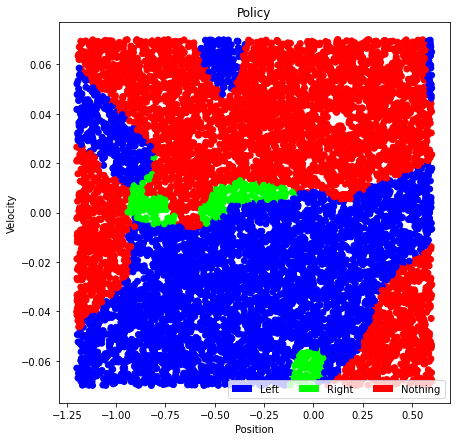

In [150]:
# reference for plot https://medium.com/@ts1829/solving-mountain-car-with-q-learning-b77bf71b1de2
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
fig = plt.figure(5, figsize=[7,7])
ax = fig.gca()
plt.set_cmap('brg')
surf = ax.scatter(X,Y, c=Z)
ax.set_xlabel('Position')
ax.set_ylabel('Velocity')
ax.set_title('Policy')
recs = []
for i in range(0,3):
     recs.append(mpatches.Rectangle((0,0),1,1,fc=sorted(colors.unique())[i]))
plt.legend(recs,labels,loc=4,ncol=3)
fig.savefig('Policy - FullG.png')
plt.show()

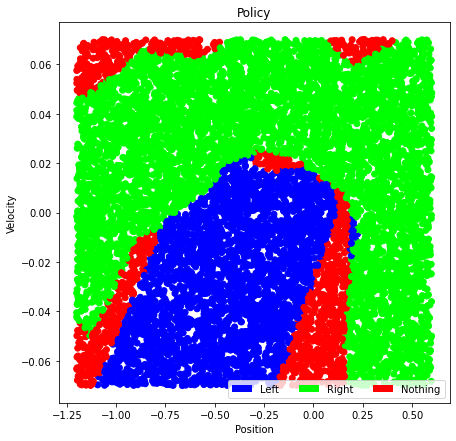

In [153]:

import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
fig = plt.figure(5, figsize=[7,7])
ax = fig.gca()
plt.set_cmap('brg')
surf = ax.scatter(X,Y, c=Z)
ax.set_xlabel('Position')
ax.set_ylabel('Velocity')
ax.set_title('Policy')
recs = []
for i in range(0,3):
     recs.append(mpatches.Rectangle((0,0),1,1,fc=sorted(colors.unique())[i]))
plt.legend(recs,labels,loc=4,ncol=3)
fig.savefig('Policy - SemiG.png')
plt.show()

In [116]:
results11.groupby(['SemiB','Epsilon','DisFactor'])['FinalState'].max().reset_index().sort_values('FinalState',ascending=False)

,SemiB,Epsilon,DisFactor,FinalState
14,True,0.00,1.0,0.545409
20,True,0.05,1.0,0.532265
23,True,0.30,1.0,0.525684
17,True,0.01,1.0,0.513890
1,False,0.00,0.8,0.093655
15,True,0.01,0.5,0.052143
21,True,0.30,0.5,-0.086201
12,True,0.00,0.5,-0.091090
18,True,0.05,0.5,-0.126276
10,False,0.30,0.8,-0.175895


In [123]:
results11.to_hdf('blah.h5','df')

ImportError: Missing optional dependency 'tables'.  Use pip or conda to install tables.

If you want to test/submit your solution **restart the kernel, run all cells and submit the dqn_autograde.py file into codegrade.**